In [1]:
import util
import graficos
import func 

In [2]:
import pandas as pd
import numpy as np
from io import StringIO
import astroquery
from astroquery.sdss import SDSS
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import time
import seaborn as sns
from scipy.integrate import quad
import matplotlib.patches as patches
import shutil
import zipfile
import os
import imageio
import matplotlib.patches as mpatches
from dust_extinction.parameter_averages import CCM89

pd.set_option('display.max_columns', None)

In [3]:
data_clean_SN10 = pd.read_csv('data_clean_SN10.csv')

data_clean_SN10

,targetObjId,specObjId,plateID,targetType,platerun,mjd,fiberId,plate,tile,ra,dec,subClass,rChi2,velDispZ,velDispErr,velDisp,snMedian,snMedian_u,snMedian_g,snMedian_i,snMedian_r,snMedian_z,err_u,err_g,err_r,err_i,err_z,dered_u,dered_g,dered_r,dered_i,dered_z,flags_photo,sciencePrimary,z,zErr,petroFlux_u,petroFlux_g,petroFlux_r,petroFlux_i,petroFlux_z,petroFluxIvar_u,petroFluxIvar_g,petroFluxIvar_r,petroFluxIvar_i,petroFluxIvar_z,modelFlux_u,modelFlux_g,modelFlux_r,modelFlux_i,modelFlux_z,modelFluxIvar_u,modelFluxIvar_g,modelFluxIvar_r,modelFluxIvar_i,modelFluxIvar_z,etiqueta,r_luminosa,r_err,DM,M_r,M_g,M_r_kcorrect,M_g_kcorrect,kcorrect_r,kcorrect_g,M_r_kcorrect_modelFlux,M_g_kcorrect_modelFlux,kcorrect_r_modelFlux,kcorrect_g_modelFlux
0,11275493895766188,1620254128968067072,1620170016328542208,SCIENCE,dr2003.07.3,53003,306,1439,1033,166.62199,41.036180,NaN,1.010408,0,7.667866,245.05280,26.74991,4.305839,17.91513,35.08849,33.77816,27.22397,0.034436,0.004057,0.003172,0.003024,0.005866,18.66808,16.70100,15.72870,15.30281,14.96340,68988043520,1,0.108391,0.000014,3.148755,13.443080,18.872400,27.377270,34.19530,0.844481,3.931171,1.704279,0.671801,0.057793,4.851333,16.277570,23.916170,33.373980,37.804230,2.936867,11.426320,5.396025,2.535473,0.236344,0,489.790331,1.177440e-15,38.450051,-22.721351,-21.749051,-41.912010,-41.525280,0.148268,0.129859,-42.151990,-41.726704,0.131085,0.123554
1,11275493896093786,1618058130090911744,1617918217236277248,SCIENCE,dr2003.07.3,53046,509,1437,1032,167.50753,41.197200,NaN,0.947584,0,8.090669,147.94990,23.75638,3.724917,14.67548,35.32435,31.05552,26.44069,0.042812,0.005415,0.004313,0.004067,0.008624,19.14399,17.38373,16.52867,16.09603,15.74319,35253360136464,1,0.316150,0.000052,1.670989,5.067446,25.112420,60.233740,89.50416,1.081867,1.024423,0.169866,0.049347,0.011626,0.330604,5.056124,23.045790,56.489970,98.674840,8.424197,26.156430,7.067600,2.604632,0.175633,0,1620.757454,3.281211e-15,41.048590,-24.519920,-23.664860,-45.468376,-44.387120,0.813291,1.469780,-45.461964,-44.474796,0.900118,1.559885
2,0,7452592724291901440,7452331590284226560,SCIENCE,2012.11.a.boss,56371,950,6619,15498,195.44774,43.967623,NaN,1.081460,0,5.146191,122.64180,27.99562,4.247354,20.51715,35.49090,30.59064,31.91411,0.031879,0.003961,0.003183,0.003196,0.006313,18.08977,16.22816,15.47645,15.10228,14.80410,143016304185672,1,0.584844,0.000254,0.070401,1.133393,8.092905,16.683160,24.78531,1.306373,5.520492,3.393373,0.613030,0.069814,0.492910,1.950971,8.494098,17.510520,26.757640,8.441098,29.313600,13.739210,5.518990,0.385029,0,3386.889064,5.694243e-15,42.649005,-27.172555,-26.420845,-46.132458,-44.795467,1.126318,1.923637,-46.093204,-45.312714,1.034532,1.851207
3,11275376875667585,1515465994879920128,1515461321955502080,SCIENCE,dr2003.05.1,52822,17,1346,995,210.84268,41.543120,STARFORMING,1.057293,0,8.666488,130.19050,14.97959,2.299342,10.48679,22.01896,19.97549,13.36058,0.030389,0.005198,0.004129,0.004104,0.008527,18.43131,17.04676,16.27003,15.88902,15.61398,35253360001296,1,0.591671,0.000192,16.401130,58.754670,138.632800,213.850400,293.07400,0.236289,0.081300,0.020490,0.010446,0.007063,11.027590,60.210040,146.868900,234.006500,332.466500,3.770941,6.423725,2.165554,0.937405,0.123664,0,3435.459004,5.751126e-15,42.679924,-26.409894,-25.633164,-48.658325,-48.248035,0.537323,1.059090,-48.710266,-48.257170,0.526602,1.041661
4,11928744689885,932279796354803712,932245161738528768,SCIENCE,dr2002.01.1,52317,126,828,599,129.05346,38.392767,NaN,0.952804,0,8.149250,91.76738,15.31083,1.695766,10.62536,23.51192,21.09256,14.97507,0.090506,0.007980,0.006038,0.005673,0.014326,19.57761,17.53338,16.72719,16.35073,16.08196,140806476399360,1,0.407390,0.000197,25.875780,57.999390,85.876200,105.215700,66.46227,0.219282,0.805033,0.520461,0.146480,0.010365,20.014580,56.844010,87.876650,113.653000,128.809600,1.179534,2.539120,1.568537,0.727669,0.061189,0,2186.363055,4.139323e-15,41.698611,-24.971421,-24.165231,-46.431900,-46.436424,-0.201036,0.229613,-46.

(array([1.9000e+01, 3.2700e+02, 2.6360e+03, 1.7161e+04, 6.8903e+04,
        9.0895e+04, 4.0515e+04, 3.4922e+04, 2.7083e+04, 6.3290e+03]),
 array([-33.16354638, -31.74790462, -30.33226287, -28.91662112,
        -27.50097936, -26.08533761, -24.66969585, -23.2540541 ,
        -21.83841234, -20.42277059, -19.00712883]),
 <BarContainer object of 10 artists>)

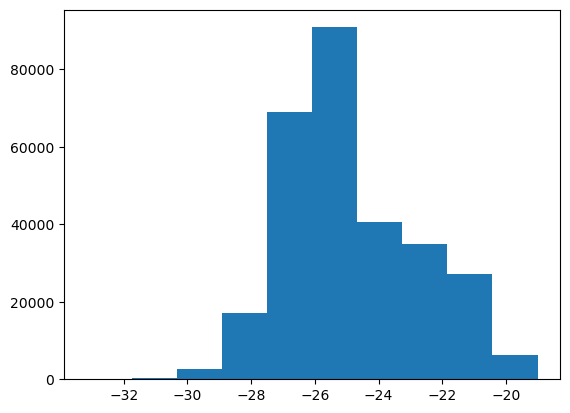

In [4]:
plt.hist(data_clean_SN10['M_r'])

In [4]:
bigint_min = -2**63
bigint_max = 2**63 - 1

# Filter values within the bigint range
valid_specObjIds = data_clean_SN10[
    (data_clean_SN10['specObjId'] >= bigint_min) &
    (data_clean_SN10['specObjId'] <= bigint_max)
]

specObjId_valid = valid_specObjIds['specObjId'].astype(str)

specObjId_valid.to_csv('specObjId.csv', index=False, header=True)

specObjId_valid


0         1620254128968067072
1         1618058130090911744
2         7452592724291901440
3         1515465994879920128
4          932279796354803712
                 ...         
288785    1533552140348319744
288786    5838921971006724096
288787    2016570367610480640
288788    2016570642488387584
288789    2016583011994200064
Name: specObjId, Length: 287969, dtype: object

In [5]:
lineas = pd.read_csv('Lineas.csv')
lineas['reliable'].unique()
#lineas.to_excel('lineas.xlsx', index=False)
lineas #['hei_5876_flux_err'][2]

,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable
0,30.756120,20.170780,-28.992330,20.513280,-17.730540,5.299756,-0.004145,2.493603,0.975244,5.546541,2.230073,5.357680,0.769682,2.679708,-2.351202,5.621909,4.880268,1.714281,6.092221,3.040849,14.720020,5.170660,-1.501123,9.277150,-9.268514,8.662139,301838234332194816,1
1,35.505730,3.982951,41.104490,4.007499,2.878706,1.980911,44.966560,2.114310,66.439770,2.300848,195.855900,3.275667,6.038770,1.703326,14.725070,1.420915,47.035450,0.787187,181.127900,3.264791,141.869800,2.374335,33.571840,1.583941,29.076580,1.573530,301836585064753152,1
2,3.355033,2.318264,5.926570,2.267337,0.927810,1.686222,6.799117,3.295096,0.282054,1.537285,1.411972,1.553122,-2.453450,2.544281,0.515722,1.324502,0.131286,0.441584,2.156769,2.580082,0.395988,1.331919,1.140947,1.460989,-2.757196,1.414798,301836310186846208,1
3,-3.942245,3.888128,-5.988896,3.954284,0.564519,3.412587,-20.734420,7.651671,4.878551,3.161905,8.321865,3.356899,-32.345600,8.062113,0.351107,3.007153,-0.379460,1.058697,19.728600,8.482477,-1.144540,3.193272,-2.445235,3.086684,-2.282001,3.166217,301835485553125376,1
4,34.589170,7.644924,28.200410,7.599117,-3.682405,3.832078,17.112660,6.445700,-1.551859,4.160296,27.351860,4.262491,-80.490090,6.273353,10.263600,4.232573,18.336980,1.837239,90.501250,8.245207,55.308560,5.541532,16.829980,4.974024,19.262890,5.110178,301834935797311488,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251664,11.163110,4.481339,11.807490,4.506737,1.040176,2.387731,8.440693,2.376312,1.727405,2.464693,10.483140,2.584692,-2.855752,2.387169,2.361801,2.196036,4.255847,0.841612,21.987800,2.867309,12.836620,2.538492,-2.851266,9.190935,1.558434,2.493621,3348597099171178496,1
251665,18.342260,2.972998,9.916848,2.900549,-1.211788,1.922055,19.759210,1.660344,4.328686,1.659969,6.198793,1.672790,1.478914,1.750965,4.500745,1.502092,14.731890,0.687836,106.470500,2.580477,44.434780,2.074670,20.479580,1.734404,14.924150,1.636165,3348599023316527104,1
251666,1.162094,3.139017,2.326743,3.176558,5.318205,2.496917,1.761674,2.054091,6.303130,2.329841,3.382865,2.262551,-2.434133,2.524924,-0.224705,2.590580,0.801356,0.831171,12.875940,2.346492,2.417076,2.507002,-4.367278,2.572318,-0.982863,2.622909,3348600397706061824,1
251667,36.411010,9.206394,59.867770,9.298899,-0.286717,2.622324,17.035000,2.706483,11.064350,3.047439,20.507730,3.291787,0.902155,2.318509,16.157730,3.292692,12.612950,1.341132,62.370270,5.478751,38.043560,4.045158,28.406850,3.810098,22.299120,3.639425,3348600947461875712,1


In [6]:
#Cantidad de líneas confiables y no confiables
lineas['reliable'].value_counts()

1    251669
Name: reliable, dtype: int64

In [7]:
#filtrar las lineas no confiables del dataframe

columnas_a_filtrar = ['reliable']

condicion = pd.Series(False, index=lineas.index)

for columna in columnas_a_filtrar:
    condicion = condicion | (lineas[columna] == 1)

lineas_reliable = lineas.loc[condicion]

Lineas = lineas_reliable

In [8]:
### Duplicados

duplicates_data_clean_SN10 = data_clean_SN10[data_clean_SN10.duplicated(subset='specObjId', keep=False)]

duplicates_lineas = lineas[lineas.duplicated(subset='specObjId', keep=False)]

print("Duplicates in data_clean_SN10:")
duplicates_data_clean_SN10

print("\nDuplicates in lineas:")
duplicates_lineas

Duplicates in data_clean_SN10:

Duplicates in lineas:


,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable


In [9]:
data_clean_SN10['specObjId'] = data_clean_SN10['specObjId'].astype('int64')

In [10]:
matching_ids = data_clean_SN10[data_clean_SN10['specObjId'].isin(lineas['specObjId'])]

print("Matching specObjIds:")
matching_ids['specObjId']

Matching specObjIds:


0         1620254128968067072
1         1618058130090911744
3         1515465994879920128
4          932279796354803712
5          932300687075731456
                 ...         
288784    1533555164005296128
288785    1533552140348319744
288787    2016570367610480640
288788    2016570642488387584
288789    2016583011994200064
Name: specObjId, Length: 251669, dtype: int64

In [11]:
matching_ids = pd.merge(data_clean_SN10, Lineas, on='specObjId')

matching_ids['specObjId']


0         1620254128968067072
1         1618058130090911744
2         1515465994879920128
3          932279796354803712
4          932300687075731456
                 ...         
251664    1533555164005296128
251665    1533552140348319744
251666    2016570367610480640
251667    2016570642488387584
251668    2016583011994200064
Name: specObjId, Length: 251669, dtype: int64

In [12]:
Lineas

,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable
0,30.756120,20.170780,-28.992330,20.513280,-17.730540,5.299756,-0.004145,2.493603,0.975244,5.546541,2.230073,5.357680,0.769682,2.679708,-2.351202,5.621909,4.880268,1.714281,6.092221,3.040849,14.720020,5.170660,-1.501123,9.277150,-9.268514,8.662139,301838234332194816,1
1,35.505730,3.982951,41.104490,4.007499,2.878706,1.980911,44.966560,2.114310,66.439770,2.300848,195.855900,3.275667,6.038770,1.703326,14.725070,1.420915,47.035450,0.787187,181.127900,3.264791,141.869800,2.374335,33.571840,1.583941,29.076580,1.573530,301836585064753152,1
2,3.355033,2.318264,5.926570,2.267337,0.927810,1.686222,6.799117,3.295096,0.282054,1.537285,1.411972,1.553122,-2.453450,2.544281,0.515722,1.324502,0.131286,0.441584,2.156769,2.580082,0.395988,1.331919,1.140947,1.460989,-2.757196,1.414798,301836310186846208,1
3,-3.942245,3.888128,-5.988896,3.954284,0.564519,3.412587,-20.734420,7.651671,4.878551,3.161905,8.321865,3.356899,-32.345600,8.062113,0.351107,3.007153,-0.379460,1.058697,19.728600,8.482477,-1.144540,3.193272,-2.445235,3.086684,-2.282001,3.166217,301835485553125376,1
4,34.589170,7.644924,28.200410,7.599117,-3.682405,3.832078,17.112660,6.445700,-1.551859,4.160296,27.351860,4.262491,-80.490090,6.273353,10.263600,4.232573,18.336980,1.837239,90.501250,8.245207,55.308560,5.541532,16.829980,4.974024,19.262890,5.110178,301834935797311488,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251664,11.163110,4.481339,11.807490,4.506737,1.040176,2.387731,8.440693,2.376312,1.727405,2.464693,10.483140,2.584692,-2.855752,2.387169,2.361801,2.196036,4.255847,0.841612,21.987800,2.867309,12.836620,2.538492,-2.851266,9.190935,1.558434,2.493621,3348597099171178496,1
251665,18.342260,2.972998,9.916848,2.900549,-1.211788,1.922055,19.759210,1.660344,4.328686,1.659969,6.198793,1.672790,1.478914,1.750965,4.500745,1.502092,14.731890,0.687836,106.470500,2.580477,44.434780,2.074670,20.479580,1.734404,14.924150,1.636165,3348599023316527104,1
251666,1.162094,3.139017,2.326743,3.176558,5.318205,2.496917,1.761674,2.054091,6.303130,2.329841,3.382865,2.262551,-2.434133,2.524924,-0.224705,2.590580,0.801356,0.831171,12.875940,2.346492,2.417076,2.507002,-4.367278,2.572318,-0.982863,2.622909,3348600397706061824,1
251667,36.411010,9.206394,59.867770,9.298899,-0.286717,2.622324,17.035000,2.706483,11.064350,3.047439,20.507730,3.291787,0.902155,2.318509,16.157730,3.292692,12.612950,1.341132,62.370270,5.478751,38.043560,4.045158,28.406850,3.810098,22.299120,3.639425,3348600947461875712,1


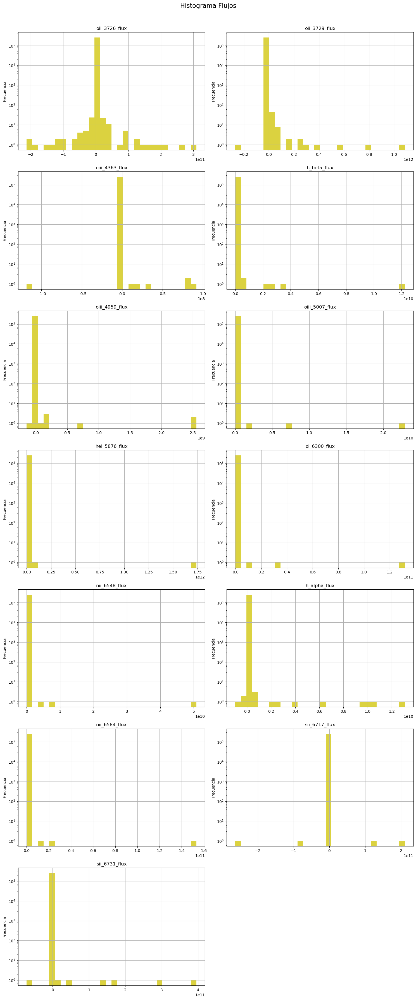

In [13]:
columns = [
    'oii_3726_flux',  'oii_3729_flux',
    'oiii_4363_flux',  'h_beta_flux', 
    'oiii_4959_flux',  'oiii_5007_flux',
    'hei_5876_flux', 'oi_6300_flux',
    'nii_6548_flux', 'h_alpha_flux',
    'nii_6584_flux', 'sii_6717_flux',
    'sii_6731_flux'
]

rows = (len(columns) + 1) // 2
cols = 2

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  

for i, column in enumerate(columns):
    column_data = Lineas[column].to_numpy()

    axes[i].hist(column_data, bins=30, color='#DBD240', edgecolor=None) ##Debe hacerse el histograma del logaritmo
    axes[i].set_title(column)
    axes[i].set_yscale('log')
    #axes[i].set_xscale('log')
    axes[i].set_ylabel('Frecuencia')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Histograma Flujos", y=1.02, fontsize=16)
plt.show()


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_93781/1431777318.py:32: RuntimeWarning: invalid value encountered in divide
  err_rel = column_data_flux / column_data_err


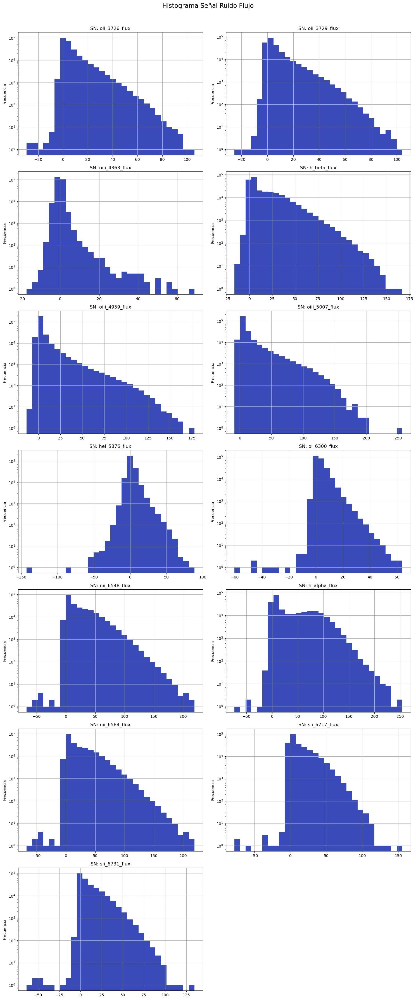

In [14]:
columns = [
    'oii_3726_flux_err',  'oii_3729_flux_err',
    'oiii_4363_flux_err',  'h_beta_flux_err', 
    'oiii_4959_flux_err',  'oiii_5007_flux_err',
    'hei_5876_flux_err', 'oi_6300_flux_err',
    'nii_6548_flux_err', 'h_alpha_flux_err',
    'nii_6584_flux_err', 'sii_6717_flux_err',
    'sii_6731_flux_err'
]

columns_1 = [
    'oii_3726_flux',  'oii_3729_flux',
    'oiii_4363_flux',  'h_beta_flux', 
    'oiii_4959_flux',  'oiii_5007_flux',
    'hei_5876_flux', 'oi_6300_flux',
    'nii_6548_flux', 'h_alpha_flux',
    'nii_6584_flux', 'sii_6717_flux',
    'sii_6731_flux'
]

rows = (len(columns) + 1) // 2
cols = 2

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  

for i, (col_err, col_flux) in enumerate(zip(columns, columns_1)):
    column_data_err = Lineas[col_err].to_numpy()
    column_data_flux = Lineas[col_flux].to_numpy()

    #Signal to Noise ratio
    err_rel = column_data_flux / column_data_err

    # Graficar la razón
    axes[i].hist(err_rel, bins=30, color='#394BB9', edgecolor=None)
    axes[i].set_title(f'SN: {col_flux}')
    axes[i].set_yscale('log')
    axes[i].set_ylabel('Frecuencia')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Histograma Señal Ruido Flujo", y=1.02, fontsize=16)
plt.show()


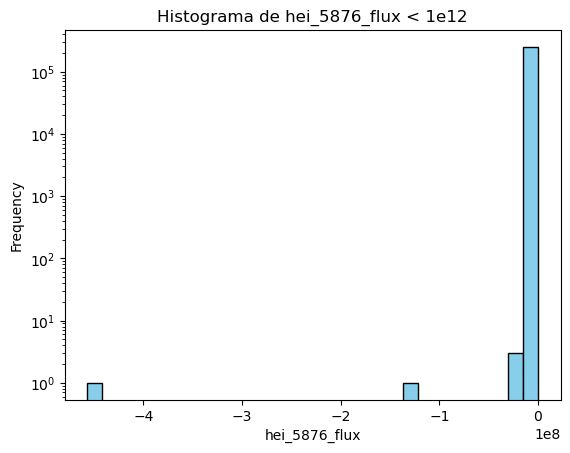

In [15]:
#### Revisando outlayers en las lineas
valores_filtrados = Lineas[Lineas['hei_5876_flux'] < 1e5]['hei_5876_flux']

plt.hist(valores_filtrados, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('hei_5876_flux')
plt.yscale('log')
plt.ylabel('Frequency')
plt.title('Histograma de hei_5876_flux < 1e12')
plt.show()

## Corrección por Extinción



In [16]:
#### Mergear los datos de fotometría ####


## Creación de un dataframe fusionado para extraer info de fotometria 
merged_df = pd.merge(data_clean_SN10, Lineas, on='specObjId') #All lines

In [17]:
extinction_model = CCM89(Rv=3.1)  # R_V typically set to 3.1

EBV = 0.1  #color excess ??????
wavelengths_angstroms = np.array([3726, 3729, 4363, 4861, 4959, 5007, 5876, 6300, 6548, 6563, 6584, 6717, 6731])
wavelengths = wavelengths_angstroms / 10000  # Convert to microns

columns_flux = [
    'oii_3726_flux', 'oii_3729_flux', 'oiii_4363_flux', 'h_beta_flux', 'oiii_4959_flux', 
    'oiii_5007_flux', 'hei_5876_flux', 'oi_6300_flux', 'nii_6548_flux', 'h_alpha_flux', 
    'nii_6584_flux', 'sii_6717_flux', 'sii_6731_flux'
]

columns_flux_err = [
    'oii_3726_flux_err', 'oii_3729_flux_err', 'oiii_4363_flux_err', 'h_beta_flux_err', 
    'oiii_4959_flux_err', 'oiii_5007_flux_err', 'hei_5876_flux_err', 'oi_6300_flux_err', 
    'nii_6548_flux_err', 'h_alpha_flux_err', 'nii_6584_flux_err', 'sii_6717_flux_err', 
    'sii_6731_flux_err'
]

A_lambda = extinction_model(wavelengths) * EBV  # Extinction in magnitudes

#dereddening
for i, col in enumerate(columns_flux):
    
    merged_df[col + '_dered'] = merged_df[col] * 10**(0.4 * A_lambda[i])
    
    merged_df[columns_flux_err[i] + '_dered'] = merged_df[columns_flux_err[i]] * 10**(0.4 * A_lambda[i]) ###Correccion error?????


colores = merged_df['dered_g'] - merged_df['dered_r']

merged_df.head()


/opt/anaconda3/lib/python3.9/site-packages/dust_extinction/helpers.py:30: UserWarning: x has no units, assuming x units are inverse microns
  warnings.warn(


,targetObjId,specObjId,plateID,targetType,platerun,mjd,fiberId,plate,tile,ra,dec,subClass,rChi2,velDispZ,velDispErr,velDisp,snMedian,snMedian_u,snMedian_g,snMedian_i,snMedian_r,snMedian_z,err_u,err_g,err_r,err_i,err_z,dered_u,dered_g,dered_r,dered_i,dered_z,flags_photo,sciencePrimary,z,zErr,petroFlux_u,petroFlux_g,petroFlux_r,petroFlux_i,petroFlux_z,petroFluxIvar_u,petroFluxIvar_g,petroFluxIvar_r,petroFluxIvar_i,petroFluxIvar_z,modelFlux_u,modelFlux_g,modelFlux_r,modelFlux_i,modelFlux_z,modelFluxIvar_u,modelFluxIvar_g,modelFluxIvar_r,modelFluxIvar_i,modelFluxIvar_z,etiqueta,r_comovil,r_err,DM,M_r,M_g,M_r_kcorrect,M_g_kcorrect,kcorrect_r,kcorrect_g,M_r_kcorrect_modelFlux,M_g_kcorrect_modelFlux,kcorrect_r_modelFlux,kcorrect_g_modelFlux,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,reliable,oii_3726_flux_dered,oii_3726_flux_err_dered,oii_3729_flux_dered,oii_3729_flux_err_dered,oiii_4363_flux_dered,oiii_4363_flux_err_dered,h_beta_flux_dered,h_beta_flux_err_dered,oiii_4959_flux_dered,oiii_4959_flux_err_dered,oiii_5007_flux_dered,oiii_5007_flux_err_dered,hei_5876_flux_dered,hei_5876_flux_err_dered,oi_6300_flux_dered,oi_6300_flux_err_dered,nii_6548_flux_dered,nii_6548_flux_err_dered,h_alpha_flux_dered,h_alpha_flux_err_dered,nii_6584_flux_dered,nii_6584_flux_err_dered,sii_6717_flux_dered,sii_6717_flux_err_dered,sii_6731_flux_dered,sii_6731_flux_err_dered
0,11275493895766188,1620254128968067072,1620170016328542208,SCIENCE,dr2003.07.3,53003,306,1439,1033,166.62199,41.036180,NaN,1.010408,0,7.667866,245.05280,26.74991,4.305839,17.91513,35.08849,33.77816,27.22397,0.034436,0.004057,0.003172,0.003024,0.005866,18.66808,16.70100,15.72870,15.30281,14.96340,68988043520,1,0.108391,0.000014,3.148755,13.443080,18.87240,27.37727,34.19530,0.844481,3.931171,1.704279,0.671801,0.057793,4.851333,16.277570,23.91617,33.37398,37.80423,2.936867,11.426320,5.396025,2.535473,0.236344,0,441.893296,1.177440e-15,33.226587,-18.272397,-17.300097,-41.912010,-41.525280,0.148268,0.129859,-42.151990,-41.726704,0.131085,0.123554,6.652304,7.640318,14.163570,7.593920,-6.602032,4.411796,5.330463,4.028941,-0.111911,5.023050,10.494230,4.926405,-2.732082,4.141782,-3.590320,6.006244,11.675370,2.093171,30.335990,5.278504,35.215620,6.313479,5.572772,5.455399,-2.341998,5.624872,1,6.703001,7.698544,14.271650,7.651868,-6.666973,4.455192,5.392920,4.076148,-0.113265,5.083839,10.623228,4.986962,-2.775614,4.207776,-3.654378,6.113407,11.897167,2.132935,30.914430,5.379153,35.890599,6.434490,5.683115,5.563418,-2.388528,5.736624
1,11275493896093786,1618058130090911744,1617918217236277248,SCIENCE,dr2003.07.3,53046,509,1437,1032,167.50753,41.197200,NaN,0.947584,0,8.090669,147.94990,23.75638,3.724917,14.67548,35.32435,31.05552,26.44069,0.042812,0.005415,0.004313,0.004067,0.008624,19.14399,17.38373,16.52867,16.09603,15.74319,35253360136464,1,0.316150,0.000052,1.670989,5.067446,25.11242,60.23374,89.50416,1.081867,1.024423,0.169866,0.049347,0.011626,0.330604,5.056124,23.04579,56.48997,98.67484,8.424197,26.156430,7.067600,2.604632,0.175633,0,1231.438251,3.281211e-15,35.452063,-19.697903,-18.842843,-45.468376,-44.387120,0.813291,1.469780,-45.461964,-44.474796,0.900118,1.559885,10.794970,6.153799,10.657100,6.229039,2.453738,3.651523,5.176898,2.923536,8.017161,3.365559,4.421491,3.102973,1.854151,3.029484,2.984702,2.695797,7.514629,1.040749,30.760110,3.153349,22.665860,3.139136,12.550190,3.059659,5.384884,2.975281,1,10.877238,6.200697,10.738423,6.276572,2.477874,3.687441,5.237556,2.957791,8.114184,3.406289,4.475841,3.141116,1.883694,3.077755,3.037955,2.743895,7.657384,1.060520,31.346637,3.213476,23.100297,3.199304,12.798689,3.120241,5.49186

## filtro por SN

In [16]:
#signal-to-noise ratios for each line flux
sn_ratios = [Lineas[col_flux] / Lineas[col_err] for col_flux, col_err in zip(columns_1, columns)]

mask = np.all([sn >= 5 for sn in sn_ratios], axis=0)
mask_1 = np.all([sn >= 2 for sn in sn_ratios], axis=0)
mask_2 = np.all([sn <= 0 for sn in sn_ratios], axis=0) #Para las lineas de absorcion 

filtered_data = Lineas[mask].copy()
filtered_data_SN2 = Lineas[mask_1].copy()
filtered_data_absorb_SN2 = Lineas[mask_2].copy()

filtered_data_absorb_SN2 #### Muchos parecen ser por errores negativos, revisar más bien un filtro por flujos negativos 

,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable
99710,-0.034703,6.730971,-0.011889,6.567762,-8.43293,5.055027,-0.126521,2.398111,-0.062577,4.504897,-0.008596,4.243010,-0.295608,2.431873,-0.161887,4.167431,-0.028816,1.405258,-0.02244,2.290753,-0.086915,4.238579,-0.195141,4.861669,-0.230596,4.839495,1380418202844030976,1
131073,0.000000,-0.692781,0.000000,-0.692781,0.00000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.00000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,0.000000,-0.692781,1805965217570514944,1
131074,0.000000,-0.703565,0.000000,-0.703565,0.00000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.00000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,0.000000,-0.703565,1805969340739119104,1
131075,0.000000,-0.692589,0.000000,-0.692589,0.00000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.00000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,0.000000,-0.692589,1805970440250746880,1
131076,0.000000,-0.701880,0.000000,-0.701880,0.00000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.00000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,0.000000,-0.701880,1805971539762374656,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131845,0.000000,-0.687108,0.000000,-0.687108,0.00000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.00000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,0.000000,-0.687108,1806108428960032768,1
131875,0.000000,-0.718671,0.000000,-0.718671,0.00000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.00000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,0.000000,-0.718671,1806109253593753600,1
131876,0.000000,-0.730575,0.000000,-0.730575,0.00000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.00000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,0.000000,-0.730575,1806112827006543872,1
131877,0.000000,-0.698830,0.000000,-0.698830,0.00000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.00000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,0.000000,-0.698830,1806115026029799424,1


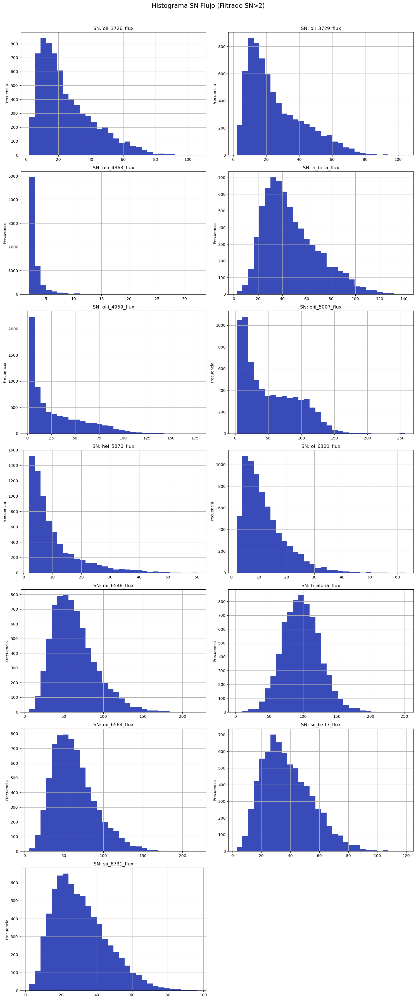

In [19]:
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()

for i, (col_err, col_flux) in enumerate(zip(columns, columns_1)):
    column_data_err = filtered_data_SN2[col_err].to_numpy()
    column_data_flux = filtered_data_SN2[col_flux].to_numpy()

    # Error relativo
    err_rel = column_data_flux / column_data_err

    # Graficar la razón
    axes[i].hist(err_rel, bins=30, color='#394BB9', edgecolor=None)
    axes[i].set_title(f'SN: {col_flux}')
    #axes[i].set_yscale('log')
    axes[i].set_ylabel('Frecuencia')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Histograma SN Flujo (Filtrado SN>2)", y=1.02, fontsize=16)
plt.show()


In [20]:
print(data_clean_SN10['specObjId'].dtype)
print(Lineas['specObjId'].dtype)
print(filtered_data_SN2['specObjId'].dtype)

int64
int64
int64


## Revisión absorción y signo de errores 

In [21]:
#### Galaxias con al menos una linea de absorcion ####

#filas donde al menos uno de los flujos es negativo
mask_negativos = np.any([Lineas[col_flux] < -1e3 for col_flux in columns_1], axis=0)
filtered_data_absorb = Lineas[mask_negativos].copy()

filtered_data_absorb


,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable
442,0.000000e+00,-7.736205e-01,-2.937904e+08,2.145881e+08,7.354305,3.343126,293.007800,4.646025,36.740430,2.963659,109.82570,3.454516,36.256380,2.619218,31.707150,2.367379,126.120500,1.478737,1253.10300,1.034363e+01,380.408700,4.460206,236.298600,3.995247,164.021200,3.636836,300632619412908032,1
1004,4.823970e+06,1.996779e+07,-3.331259e+04,7.001420e+04,-10.894560,4.908332,-0.956976,7.976187,-2.723688,4.798745,18.33410,5.193230,-38.595640,6.901981,5.413877,4.626708,-1.763341,1.487107,15.54133,7.891738e+00,-5.318644,4.485454,3.910398,4.998403,0.559581,5.658577,305223909706328064,1
1089,0.000000e+00,-7.433726e-01,-8.434700e+06,3.226995e+07,11.669740,2.429860,184.244400,3.413224,207.714800,3.668630,630.81760,6.758337,23.225320,2.235373,14.513950,1.578087,11.014260,0.501736,625.39110,5.609576e+00,33.221550,1.513350,59.254750,2.204571,50.165700,1.909134,306359431312992256,1
1285,-3.891985e+05,2.463218e+05,1.057904e+05,5.937286e+04,-9.133791,16.456020,89.003050,17.260370,27.078290,19.301760,79.01498,18.087920,-242.732500,15.993180,29.730010,22.831420,29.196990,9.636489,91.85942,3.001274e+01,88.064870,29.065840,-53.216820,32.217150,9.198311,33.088790,308562027511572480,1
1665,7.025639e+00,5.778131e+00,2.065065e+01,5.734292e+00,4.426746,2.994723,8.367003,2.344523,4.965544,3.006798,14.87358,3.066649,5.356696,2.398125,5.300265,2.972579,14.518800,1.256308,29.14800,3.133500e+00,43.792060,3.789310,-7560.308000,49908.090000,0.000000,-0.772273,309773414397143040,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247219,-3.327167e+01,2.833424e+01,4.053691e+01,2.806994e+01,-12.439480,7.134011,0.229072,2.719393,-5.284588,7.552900,22.77169,7.376886,-1.382531,3.233454,4.725953,7.478558,2.401749,2.639525,12.67113,3.757074e+00,7.244230,7.961408,-1952.821000,853.316800,55956.450000,30298.300000,3140186593650829312,1
247376,7.675728e+04,1.672879e+05,-3.372224e+05,9.470457e+05,-6.861567,11.911740,34.551430,8.454096,-12.027210,12.387830,20.20296,12.057940,-18.446980,8.631251,7.602675,12.736420,7.527311,4.514151,42.44670,9.944263e+00,22.704110,13.615710,18.615480,18.672770,-24.733050,18.676540,3141337507447203840,1
248463,3.434356e+00,5.493831e+00,1.219747e+01,5.454394e+00,1.869811,2.869437,-9.117325,4.728681,10.879740,3.152828,12.47007,3.186098,-12.990660,4.397495,-0.968143,2.558183,0.000000,-0.696715,-24405.53000,8.140618e+07,0.000000,-0.696715,111397.700000,384730.700000,-12.936940,8.986802,3242741615814535168,1
249271,-3.274605e+07,1.661087e+08,1.929681e+05,6.333708e+05,-8.778385,3.183189,3.742862,3.184499,7.750528,3.444934,12.80049,3.455247,-3.995691,3.022460,1.858650,2.961812,5.572744,1.214685,26.63870,4.653758e+00,16.808680,3.663767,5.642848,3.303697,2.472919,3.177986,3320373184854779904,1


In [22]:
### Flujos negativos, sin importar galaxia ni linea ###

flujos_negativos_con_errores = []

for col_flux, col_err in zip(columns_1, columns):
    
    flujos_negativos_columna = Lineas[col_flux][Lineas[col_flux] < 0]
    errores_columna = Lineas[col_err][Lineas[col_flux] < 0]
    
    flujos_negativos_con_errores.extend(zip(flujos_negativos_columna, errores_columna))

flujos_negativos_con_errores = np.array(flujos_negativos_con_errores)

flujos_negativos_con_errores


array([[-3.942245 ,  3.888128 ],
       [-4.087584 ,  4.7126   ],
       [-1.258809 ,  2.78529  ],
       ...,
       [-4.005463 ,  2.023955 ],
       [-7.978994 ,  4.374829 ],
       [-0.9828629,  2.622909 ]])

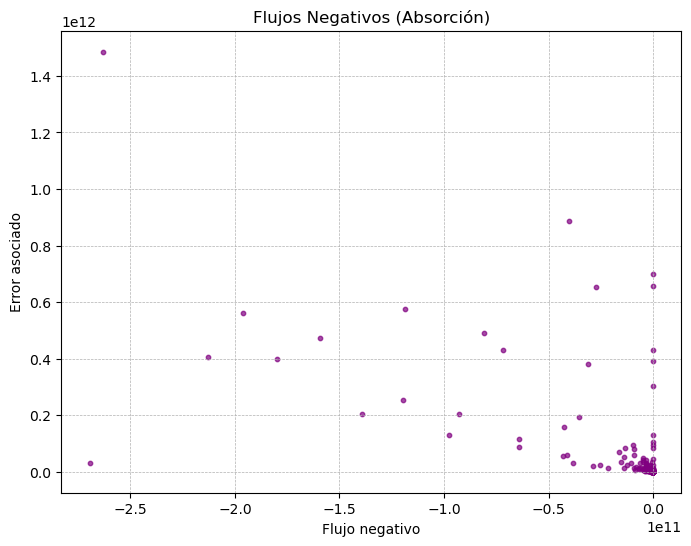

In [23]:
flujos_negativos = flujos_negativos_con_errores[:, 0]  
errores = flujos_negativos_con_errores[:, 1]  

plt.figure(figsize=(8, 6))
plt.scatter(flujos_negativos, errores, s=10, color='purple', alpha=0.7)
plt.xlabel('Flujo negativo')
plt.ylabel('Error asociado')
#plt.xlim(-1000,0)
#plt.ylim(0,1000)
#plt.yscale('log')
#plt.xscale('log')
plt.title('Flujos Negativos (Absorción)')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()


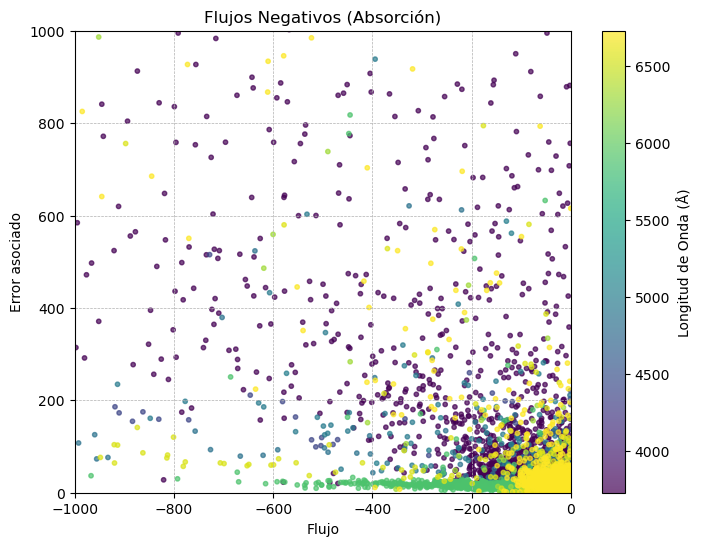

In [24]:
### Absorción con mapa de color por líneas ###

wavelengths = [3726, 3729, 4363, 4861, 4959, 5007, 5876, 6300, 6548, 6563, 6584, 6717, 6731]  # Longitudes de onda para cada línea

flujos_negativos_con_errores = []

for i, col_flux in enumerate(columns_1):
    
    mask_flux_neg =  Lineas[col_flux] < 0
    flujos_neg = Lineas[col_flux][mask_flux_neg]
    errores = Lineas[columns[i]][mask_flux_neg]  
    
    for flujo, error in zip(flujos_neg, errores):
        flujos_negativos_con_errores.append([flujo, error, wavelengths[i]])

flujos_negativos_con_errores = np.array(flujos_negativos_con_errores)

flujos_negativos = flujos_negativos_con_errores[:, 0]
errores = flujos_negativos_con_errores[:, 1]
longitudes_onda = flujos_negativos_con_errores[:, 2]


plt.figure(figsize=(8, 6))

scatter = plt.scatter(flujos_negativos, errores, c=longitudes_onda, cmap='viridis', s=10, alpha=0.7)
plt.xlabel('Flujo')
plt.ylabel('Error asociado')
plt.title('Flujos Negativos (Absorción)')
#plt.xscale('log')
#plt.yscale('log')
plt.xlim(-1e3,0)
plt.ylim(0,1e3)
cbar = plt.colorbar(scatter)
cbar.set_label('Longitud de Onda (Å)')

plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()


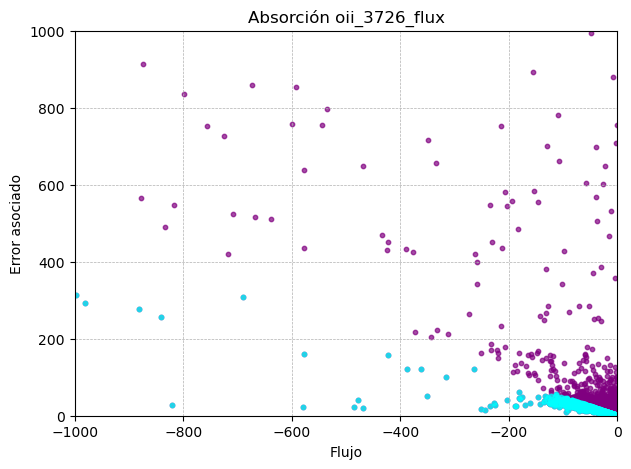

3         -3.942245
19        -4.087584
37        -1.258809
43        -4.895977
44        -5.443334
            ...    
251610   -16.030160
251614    -5.853713
251633   -24.990720
251637    -7.720880
251654   -16.862950
Name: oii_3726_flux, Length: 31593, dtype: float64
81        -7.857152
164      -25.882160
306      -25.738420
319      -13.836750
357      -14.007900
            ...    
251455   -42.014430
251514    -5.757199
251529    -8.585160
251606   -27.536360
251637    -7.720880
Name: oii_3726_flux, Length: 2904, dtype: float64


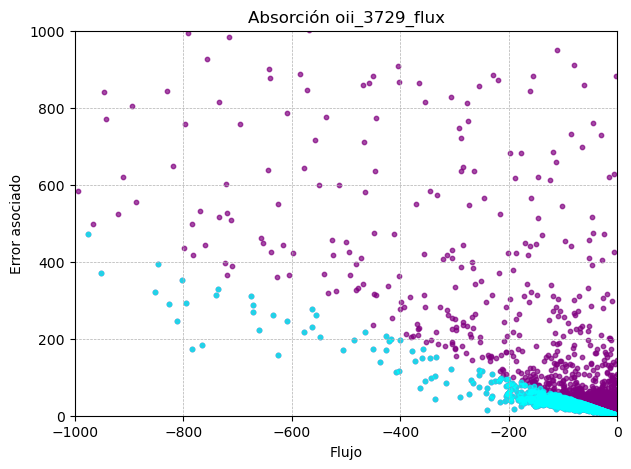

0        -28.992330
3         -5.988896
13        -3.584718
20        -3.366309
25       -26.259200
            ...    
251604   -13.064790
251613   -12.309300
251649    -5.210348
251652    -6.629528
251658   -31.595740
Name: oii_3729_flux, Length: 35053, dtype: float64
117       -37.990540
129      -116.784700
161      -150.314700
179       -85.305530
190       -83.475100
             ...    
251191    -38.577720
251305     -7.956870
251613    -12.309300
251649     -5.210348
251658    -31.595740
Name: oii_3729_flux, Length: 4485, dtype: float64


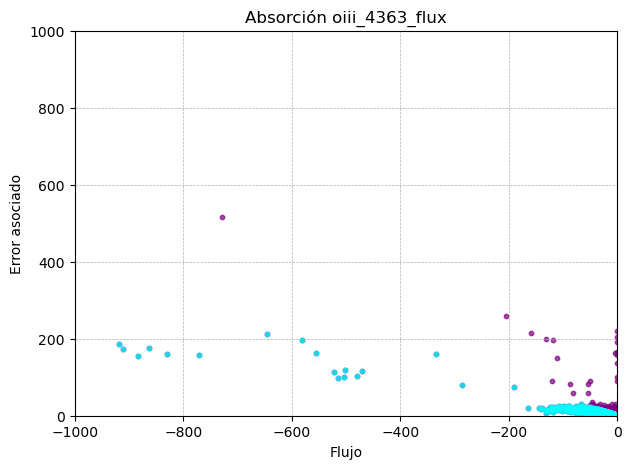

0        -17.730540
4         -3.682405
7        -10.868540
8         -6.281541
9         -0.844503
            ...    
251654    -1.686509
251658    -4.160031
251665    -1.211788
251667    -0.286717
251668    -0.573139
Name: oiii_4363_flux, Length: 137208, dtype: float64
0        -17.730540
7        -10.868540
18        -8.181489
19        -8.130647
25       -14.437880
            ...    
251607    -7.815666
251613   -12.624410
251614   -15.881410
251641    -7.175288
251651    -4.381387
Name: oiii_4363_flux, Length: 25117, dtype: float64


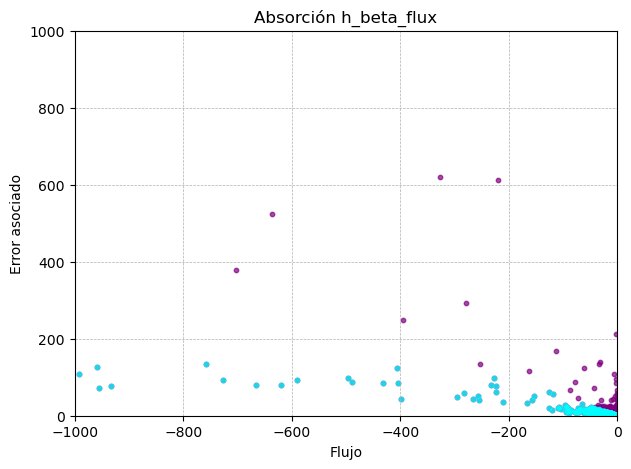

0         -0.004145
3        -20.734420
29        -1.802365
51        -8.337760
114       -0.372385
            ...    
251544   -12.521060
251568    -1.827952
251637    -3.923535
251646    -1.006772
251652    -3.476688
Name: h_beta_flux, Length: 13824, dtype: float64
3        -20.734420
51        -8.337760
187      -47.357920
210      -14.562340
343      -26.379510
            ...    
251024    -4.505266
251066   -10.450980
251136   -16.714510
251402   -11.108660
251544   -12.521060
Name: h_beta_flux, Length: 1714, dtype: float64


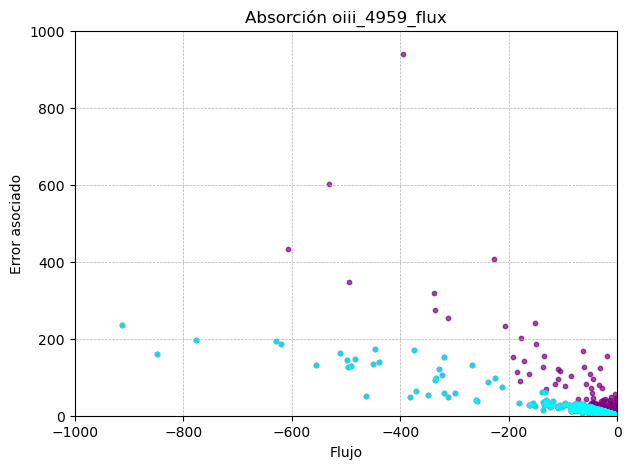

4        -1.551859
15       -0.101403
24       -1.315939
25       -2.910219
28       -7.298867
            ...   
251614   -2.062846
251641   -0.714288
251651   -2.307641
251654   -4.943967
251658   -1.551958
Name: oiii_4959_flux, Length: 41410, dtype: float64
147      -10.193590
172       -9.307508
173      -22.199780
260      -36.801800
266       -4.631579
            ...    
251427   -10.368250
251497   -15.202440
251590   -14.685880
251604   -40.466590
251610   -15.078610
Name: oiii_4959_flux, Length: 4398, dtype: float64


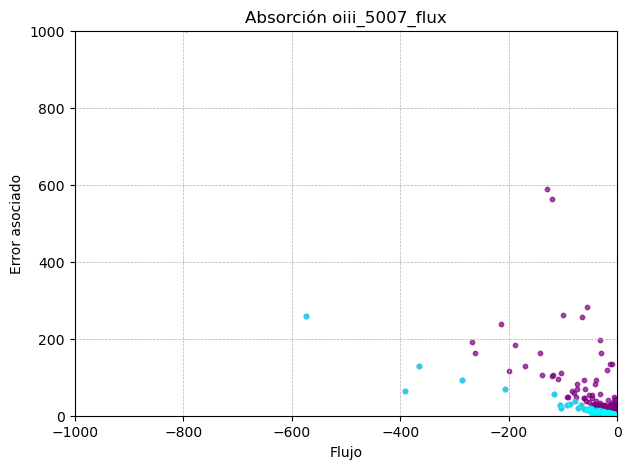

29       -1.816677
37       -0.764595
71       -4.665146
106      -0.125995
119      -3.216959
            ...   
251568   -0.959273
251605   -1.413668
251607   -1.802144
251633   -5.178883
251641   -0.334492
Name: oiii_5007_flux, Length: 8758, dtype: float64
146       -8.135242
250       -3.937084
328       -5.994664
2150      -3.372394
2216      -4.933031
            ...    
245702    -6.943422
246066    -4.421820
249582   -16.907240
250212   -22.985480
250351   -16.082370
Name: oiii_5007_flux, Length: 373, dtype: float64


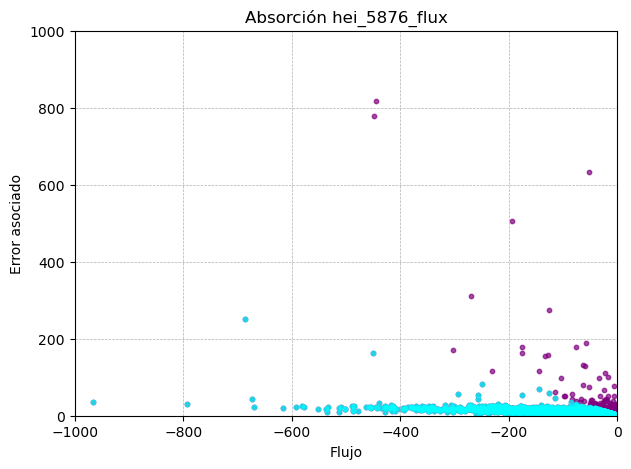

2         -2.453450
3        -32.345600
4        -80.490090
7        -11.547520
8         -8.583169
            ...    
251657    -1.412830
251658    -3.597127
251662    -3.059813
251664    -2.855752
251666    -2.434133
Name: hei_5876_flux, Length: 100786, dtype: float64
3        -32.345600
4        -80.490090
7        -11.547520
8         -8.583169
20       -34.851200
            ...    
251613   -50.805120
251637   -12.064650
251641   -13.392630
251649   -20.360750
251658    -3.597127
Name: hei_5876_flux, Length: 33449, dtype: float64


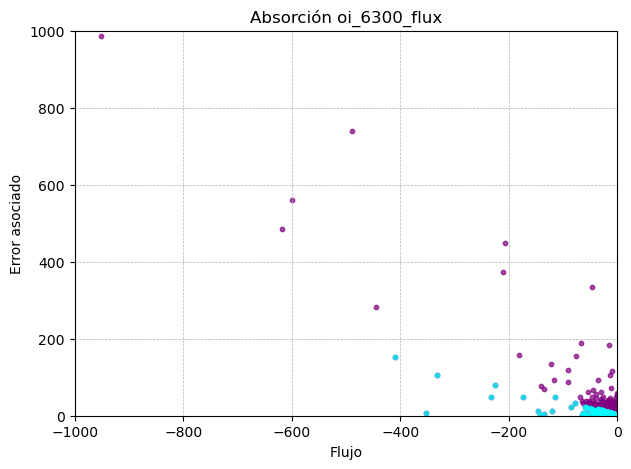

0        -2.351202
8        -1.290789
13       -0.653930
29       -0.476895
51       -0.938386
            ...   
251638   -1.024987
251649   -1.705526
251651   -5.022345
251654   -6.163271
251666   -0.224705
Name: oi_6300_flux, Length: 39756, dtype: float64
248       -8.264835
260      -23.813360
291      -12.210140
320       -7.006119
690      -13.045770
            ...    
251156    -4.492174
251244    -6.238241
251316    -3.821014
251478    -8.908217
251651    -5.022345
Name: oi_6300_flux, Length: 2306, dtype: float64


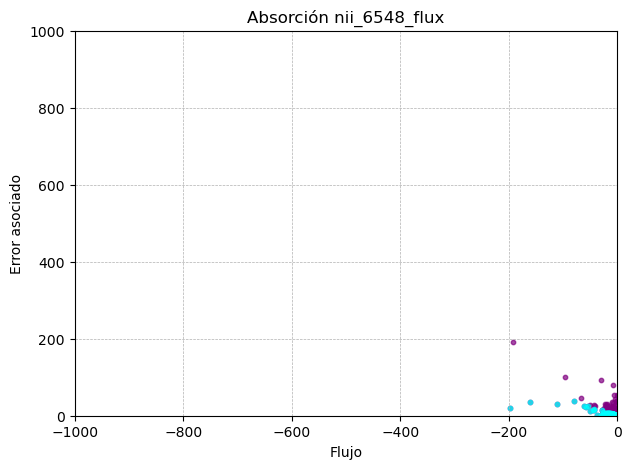

3        -0.379460
24       -0.445225
29       -1.210994
37       -0.570984
97       -0.210615
            ...   
251590   -1.679235
251607   -0.312268
251613   -0.295868
251637   -0.152171
251641   -0.755217
Name: nii_6548_flux, Length: 11886, dtype: float64
99       -1.138081
128      -3.155749
1031     -2.240133
2124     -1.308962
2775     -1.031600
            ...   
248815   -2.654912
249601   -2.435336
251307   -2.389381
251350   -1.928549
251355   -6.416717
Name: nii_6548_flux, Length: 742, dtype: float64


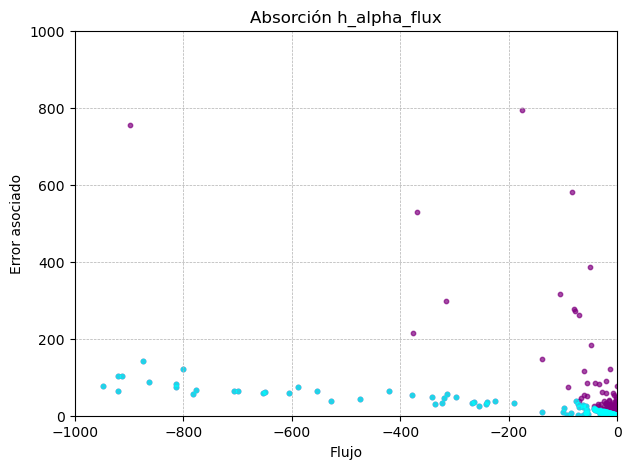

146      -1.572192
176      -1.632578
251      -0.260211
269      -5.534413
385      -0.084344
            ...   
251344   -0.852618
251348   -2.637193
251361   -2.501036
251477   -0.774320
251483   -0.120073
Name: h_alpha_flux, Length: 3610, dtype: float64
863      -18.771810
5167     -12.309450
6710      -5.171170
7638      -3.983668
9943     -28.776820
            ...    
243933    -4.245088
245333    -7.566141
246106    -3.651849
248222    -5.950091
249899    -3.588120
Name: h_alpha_flux, Length: 305, dtype: float64


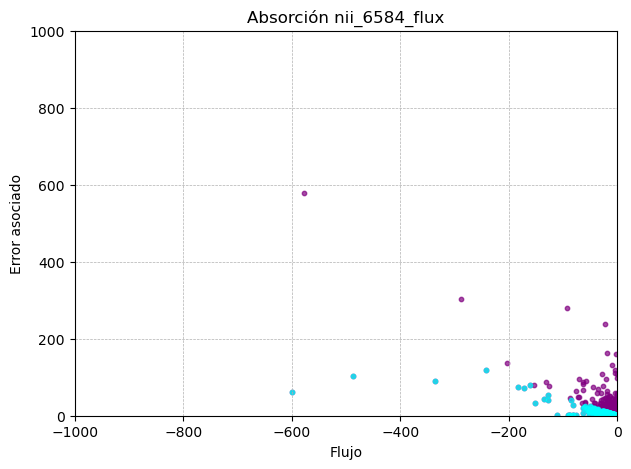

3        -1.144540
24       -1.342903
29       -3.652637
37       -1.722220
97       -0.635262
            ...   
251590   -5.064960
251607   -0.941872
251613   -0.892407
251637   -0.458984
251641   -2.277909
Name: nii_6584_flux, Length: 11886, dtype: float64
99        -3.432714
128       -9.518468
1031      -6.756757
2124      -3.948130
2775      -3.111545
            ...    
248815    -8.007827
249601    -7.345536
251307    -7.206924
251350    -5.816948
251355   -19.354300
Name: nii_6584_flux, Length: 742, dtype: float64


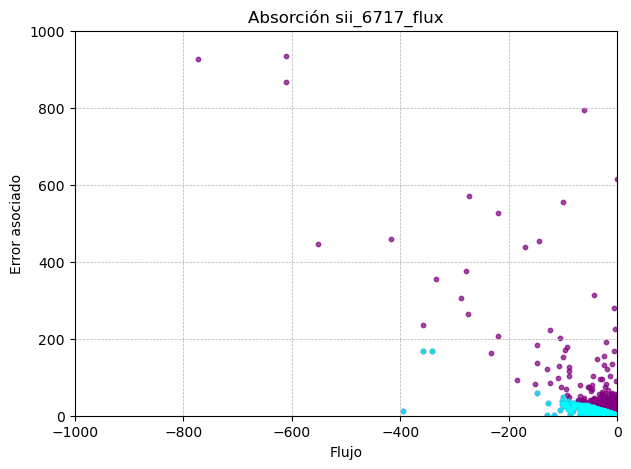

0         -1.501123
3         -2.445235
13       -10.576380
20        -0.794770
27        -1.332091
            ...    
251649    -1.877014
251652   -20.274620
251654   -10.424130
251664    -2.851266
251666    -4.367278
Name: sii_6717_flux, Length: 31943, dtype: float64
28       -25.213400
44        -5.872660
105      -12.357530
128       -7.867494
250       -5.614557
            ...    
251461    -9.620213
251477    -7.295374
251544    -9.951433
251548   -19.779460
251652   -20.274620
Name: sii_6717_flux, Length: 3099, dtype: float64


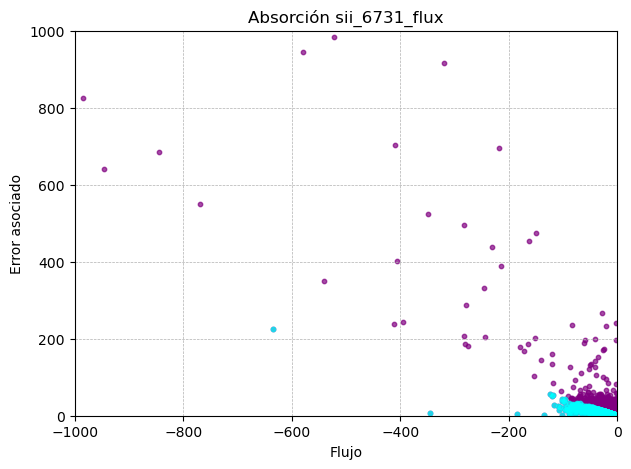

0        -9.268514
2        -2.757196
3        -2.282001
13       -0.863352
15       -4.787444
            ...   
251641   -2.145262
251651   -0.769415
251657   -4.005463
251658   -7.978994
251666   -0.982863
Name: sii_6731_flux, Length: 41296, dtype: float64
29        -4.624954
138       -7.800606
192      -36.141210
259      -25.788660
308      -14.638560
            ...    
251329   -11.485110
251475    -6.368025
251539    -7.623341
251543    -9.754230
251593   -20.033190
Name: sii_6731_flux, Length: 4306, dtype: float64


In [25]:
### Mirar absorción por cada una de las lineas###

for flux_col, error_col in zip(columns_1, columns):
    
    mask_negativos = Lineas[flux_col] < 0

    mask_SN2 = np.abs(Lineas[flux_col])/Lineas[error_col] >= 2 #Mascara para filtrar por señal ruido

    flujos_negativos = Lineas[flux_col][mask_negativos]
    errores = Lineas[error_col][mask_negativos]

    negativos_SN2 = Lineas[flux_col][mask_negativos & mask_SN2] #Flujos filtrados por razón señal ruido
    errores_SN2 = Lineas[error_col][mask_negativos & mask_SN2]

    # Si hay datos, se genera el gráfico
    if not flujos_negativos.empty:
        plt.figure(figsize=(7, 5))
        
        plt.scatter(flujos_negativos, errores, s=10, color='purple', alpha=0.7)
        plt.scatter(negativos_SN2, errores_SN2, s=10, color='cyan', alpha=0.7)
        plt.xlabel('Flujo')
        plt.ylabel('Error asociado')
        plt.title(f'Absorción {flux_col}')

        plt.xlim(-1e3,0)
        plt.ylim(0,1e3)
        
        plt.grid(True, which="both", ls="--", linewidth=0.5)
        plt.show()
        print(flujos_negativos)
        print(negativos_SN2)


In [26]:
### Flujos negativos con errores negativos: ###

flujos_y_errores_negativos = flujos_negativos_con_errores[flujos_negativos_con_errores[:, 1] < 0]

print(f"Flujos negativos con error negativo:\n {flujos_y_errores_negativos}")


Flujos negativos con error negativo:
 []


In [27]:
# Detectar errores negativos y flujos positivos o negativos para cada columna de manera independiente
conteo_errores_con_flujos_positivos = {}
conteo_errores_con_flujos_negativos = {}

columns_flux = [
    'oii_3726_flux', 'oii_3729_flux', 'oiii_4363_flux', 'h_beta_flux', 'oiii_4959_flux', 
    'oiii_5007_flux', 'hei_5876_flux', 'oi_6300_flux', 'nii_6548_flux', 'h_alpha_flux', 
    'nii_6584_flux', 'sii_6717_flux', 'sii_6731_flux'
]

columns_flux_err = [
    'oii_3726_flux_err', 'oii_3729_flux_err', 'oiii_4363_flux_err', 'h_beta_flux_err', 
    'oiii_4959_flux_err', 'oiii_5007_flux_err', 'hei_5876_flux_err', 'oi_6300_flux_err', 
    'nii_6548_flux_err', 'h_alpha_flux_err', 'nii_6584_flux_err', 'sii_6717_flux_err', 
    'sii_6731_flux_err'
]

for err_col, flux_col in zip(columns_flux_err, columns_flux):
    # Errores negativos
    errores_negativos = Lineas[err_col] < 0
    
    # Flujos positivos y negativos
    flujos_positivos = Lineas[flux_col] > 0
    flujos_negativos = Lineas[flux_col] < 0
    print(errores_negativos.sum())
    
    # Contar casos de errores negativos con flujos positivos
    #print(Lineas[flux_col][errores_negativos & flujos_positivos])
    
    # Contar casos de errores negativos con flujos negativos
    #conteo_errores_con_flujos_negativos[flux_col] = (errores_negativos & flujos_negativos).sum()

# Mostrar resultados
print("Errores negativos con flujos positivos por columna:")
print(conteo_errores_con_flujos_positivos)

print("Errores negativos con flujos negativos por columna:")
print(conteo_errores_con_flujos_negativos)



10805
9985
237
124
117
118
715
951
1001
1157
1001
1245
1258
Errores negativos con flujos positivos por columna:
{}
Errores negativos con flujos negativos por columna:
{}


10805


(array([    0.,     0.,     0.,     0.,     0., 10805.,     0.,     0.,
            0.,     0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <BarContainer object of 10 artists>)

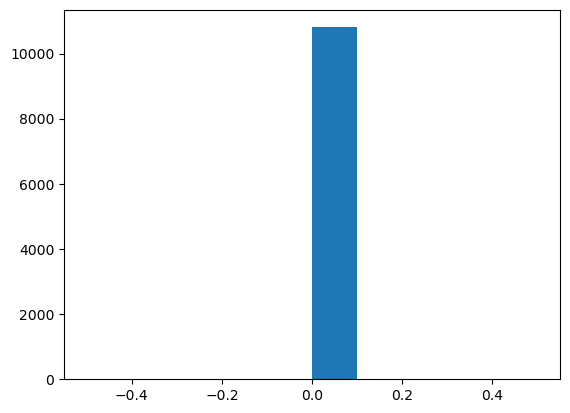

In [28]:
hay_error_negativo = (Lineas['oii_3726_flux_err'] < 0).sum()

print(hay_error_negativo)

#plt.plot(Lineas['oii_3726_flux'][Lineas['oii_3726_flux_err']< 0], Lineas['oii_3726_flux_err'][Lineas['oii_3726_flux_err']< 0])
plt.hist(Lineas['oii_3726_flux'][Lineas['oii_3726_flux_err']< 0])

In [29]:
### Qué valores de flujo tienen los valores de error negativos? ###

valores_unicos_por_linea = {}

for err_col, flux_col in zip(columns_flux_err, columns_flux):
    valores_unicos = Lineas[flux_col][Lineas[err_col] < 0].unique()
    valores_unicos_por_linea[flux_col] = valores_unicos

for linea, valores in valores_unicos_por_linea.items():
    print(f"Valores únicos en '{linea}' con error negativo en '{linea}_err':", valores)


Valores únicos en 'oii_3726_flux' con error negativo en 'oii_3726_flux_err': [0.]
Valores únicos en 'oii_3729_flux' con error negativo en 'oii_3729_flux_err': [0.]
Valores únicos en 'oiii_4363_flux' con error negativo en 'oiii_4363_flux_err': [0.]
Valores únicos en 'h_beta_flux' con error negativo en 'h_beta_flux_err': [0.]
Valores únicos en 'oiii_4959_flux' con error negativo en 'oiii_4959_flux_err': [0.]
Valores únicos en 'oiii_5007_flux' con error negativo en 'oiii_5007_flux_err': [0.]
Valores únicos en 'hei_5876_flux' con error negativo en 'hei_5876_flux_err': [0.]
Valores únicos en 'oi_6300_flux' con error negativo en 'oi_6300_flux_err': [0.]
Valores únicos en 'nii_6548_flux' con error negativo en 'nii_6548_flux_err': [0.]
Valores únicos en 'h_alpha_flux' con error negativo en 'h_alpha_flux_err': [0.]
Valores únicos en 'nii_6584_flux' con error negativo en 'nii_6584_flux_err': [0.]
Valores únicos en 'sii_6717_flux' con error negativo en 'sii_6717_flux_err': [0.]
Valores únicos en 

In [30]:
### Elípticas Perfectas ###

mask_negativos = np.all([Lineas[col_flux] < 0 for col_flux in columns_1], axis=0)

elipticas_perfectas = Lineas[mask_negativos].copy()

elipticas_perfectas


,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,specObjId,reliable
99710,-0.034703,6.730971,-0.011889,6.567762,-8.43293,5.055027,-0.126521,2.398111,-0.062577,4.504897,-0.008596,4.24301,-0.295608,2.431873,-0.161887,4.167431,-0.028816,1.405258,-0.02244,2.290753,-0.086915,4.238579,-0.195141,4.861669,-0.230596,4.839495,1380418202844030976,1


In [31]:
### Galaxias con absorcion en OII 3726 ###

mask_abs_oii3726 = Lineas['oii_3726_flux'] < 0

df_abs_oii3726 = Lineas[mask_abs_oii3726].copy()

merged_df_abs_oxigen= pd.merge(data_clean_SN10, df_abs_oii3726, on='specObjId')

merged_df_abs_oxigen

,targetObjId,specObjId,plateID,targetType,platerun,mjd,fiberId,plate,tile,ra,dec,subClass,rChi2,velDispZ,velDispErr,velDisp,snMedian,snMedian_u,snMedian_g,snMedian_i,snMedian_r,snMedian_z,err_u,err_g,err_r,err_i,err_z,dered_u,dered_g,dered_r,dered_i,dered_z,flags_photo,sciencePrimary,z,zErr,petroFlux_u,petroFlux_g,petroFlux_r,petroFlux_i,petroFlux_z,petroFluxIvar_u,petroFluxIvar_g,petroFluxIvar_r,petroFluxIvar_i,petroFluxIvar_z,modelFlux_u,modelFlux_g,modelFlux_r,modelFlux_i,modelFlux_z,modelFluxIvar_u,modelFluxIvar_g,modelFluxIvar_r,modelFluxIvar_i,modelFluxIvar_z,etiqueta,r_comovil,r_err,DM,M_r,M_g,M_r_kcorrect,M_g_kcorrect,kcorrect_r,kcorrect_g,M_r_kcorrect_modelFlux,M_g_kcorrect_modelFlux,kcorrect_r_modelFlux,kcorrect_g_modelFlux,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,reliable
0,11928744689885,932279796354803712,932245161738528768,SCIENCE,dr2002.01.1,52317,126,828,599,129.05346,38.392767,NaN,0.952804,0,8.149250,91.76738,15.31083,1.695766,10.62536,23.51192,21.09256,14.97507,0.090506,0.007980,0.006038,0.005673,0.014326,19.57761,17.53338,16.72719,16.35073,16.08196,140806476399360,1,0.407390,0.000197,25.875780,57.999390,85.876200,105.21570,66.46227,0.219282,0.805033,0.520461,0.146480,0.010365,20.014580,56.844010,87.876650,113.653000,128.80960,1.179534,2.539120,1.568537,0.727669,0.061189,0,1553.487701,4.139323e-15,35.956539,-20.003859,-19.197669,-46.431900,-46.436424,-0.201036,0.229613,-46.594116,-46.567623,-0.063823,0.382659,-3.515612,2.646063e+00,-2.260835,2.553784,-3.819468,1.697840,4.007297,1.566365,3.900787,1.637198,3.391810,1.643341,-0.415292,1.604108,-1.682257,1.250720,0.599863,0.430420,1.578379,1.425615,1.809324,1.298243,-0.088063,1.284192,0.227988,1.270535,1
1,11928744755287,932308383657125888,932245161738528768,SCIENCE,dr2002.01.1,52317,230,828,599,128.91844,38.536968,NaN,0.854916,0,6.065471,107.27150,19.81453,2.690603,13.99013,28.13635,25.51749,19.46503,0.048247,0.005490,0.004111,0.003920,0.009218,18.36225,16.51336,15.68478,15.30064,15.00700,35253360660532,1,0.122167,0.000015,19.884500,1.034177,5.418273,13.45671,28.71465,1.176108,5.070589,3.241263,0.909595,0.062996,-0.287019,0.578234,5.460443,14.374870,24.20505,4.385769,17.911510,6.969547,3.235293,0.220488,0,496.626658,1.323279e-15,33.480150,-18.569880,-17.741300,-40.884210,-38.924324,0.196178,0.034460,-41.065600,-38.845917,0.369153,0.587280,-11.271870,5.977410e+00,9.870803,6.362919,-3.003349,3.274293,5.358621,2.173898,-2.283114,3.048410,7.597531,3.179283,1.836374,2.331264,3.511138,2.756717,5.542679,1.065915,14.082690,2.313452,16.718000,3.215043,8.137333,2.942487,0.354361,2.842751,1
2,11928744755300,932281445622245376,932245161738528768,SCIENCE,dr2002.01.1,52317,132,828,599,129.03515,38.470848,NaN,0.875814,0,6.024880,101.75360,20.65035,3.144472,14.44576,30.29886,27.89149,20.85295,0.053546,0.006833,0.005201,0.004944,0.010835,19.63613,17.79704,17.00039,16.62178,16.32051,35253360136464,1,0.147969,0.000011,47.336680,431.410600,1041.046000,1510.88800,1944.01600,0.063103,0.092861,0.021528,0.012625,0.003058,68.288550,471.809700,1132.689000,1675.414000,2302.97400,0.470973,0.563435,0.157023,0.076299,0.013887,4,598.243372,1.594041e-15,33.884389,-17.658509,-16.861859,-47.012505,-46.348164,0.164057,0.456165,-47.134730,-46.434097,0.194682,0.444909,-6.742167,3.927619e+00,8.754645,4.225399,-2.528073,2.538701,4.104414,1.826468,-0.592014,2.247948,-0.639527,2.248261,0.346319,1.848899,1.486786,1.949563,2.528955,0.765564,2.769020,1.407123,7.627913,2.309114,-1.482076,1.957986,1.886062,2.027570,1
3,11928744820859,932294639761778688,932245161738528768,SCIENCE,dr2002.01.1,52317,180,828,599,129.27828,38.580936,NaN,0.873105,

15       0.97949
25       0.98000
35       1.03216
42       0.79003
50       0.89467
          ...   
31538    0.79856
31570    0.99969
31575    0.94731
31576    0.83880
31591    0.90638
Length: 2904, dtype: float64

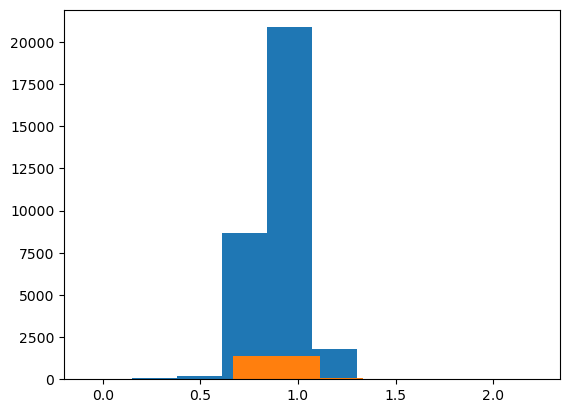

In [32]:
colores = merged_df_abs_oxigen['dered_g']-merged_df_abs_oxigen['dered_r']
colores_SN2 = merged_df_abs_oxigen['dered_g'][np.abs(merged_df_abs_oxigen['oii_3726_flux']/merged_df_abs_oxigen['oii_3726_flux_err'])>=2] - merged_df_abs_oxigen['dered_r'][np.abs(merged_df_abs_oxigen['oii_3726_flux']/merged_df_abs_oxigen['oii_3726_flux_err'])>=2]

plt.hist(colores)
plt.hist(colores_SN2)

#merged_df_abs_oxigen['dered_g'].loc(np.abs(merged_df_abs_oxigen['oii_3726_flux']/merged_df_abs_oxigen['oii_3726_flux_err'])>=2)
colores_SN2


15       False
25       False
35       False
42       False
50       False
         ...  
31538    False
31570    False
31575    False
31576    False
31591    False
Length: 2904, dtype: bool


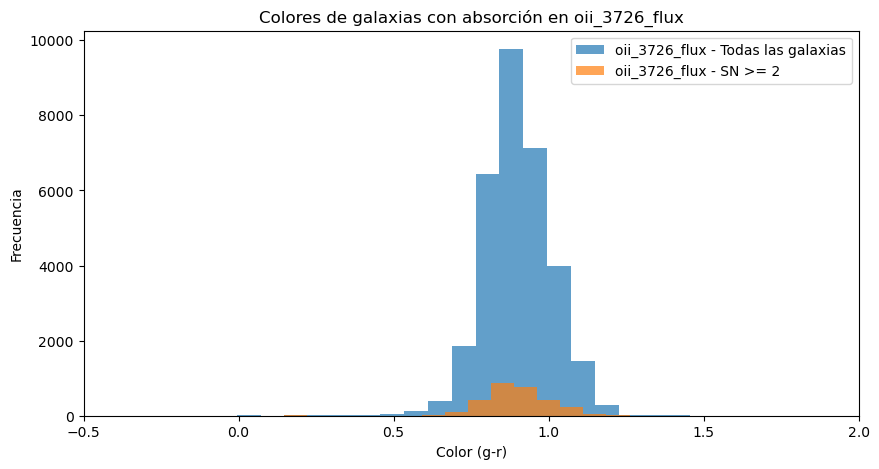

2        False
13       False
26       False
27       False
41       False
         ...  
35036    False
35038    False
35040    False
35045    False
35049    False
Length: 4485, dtype: bool


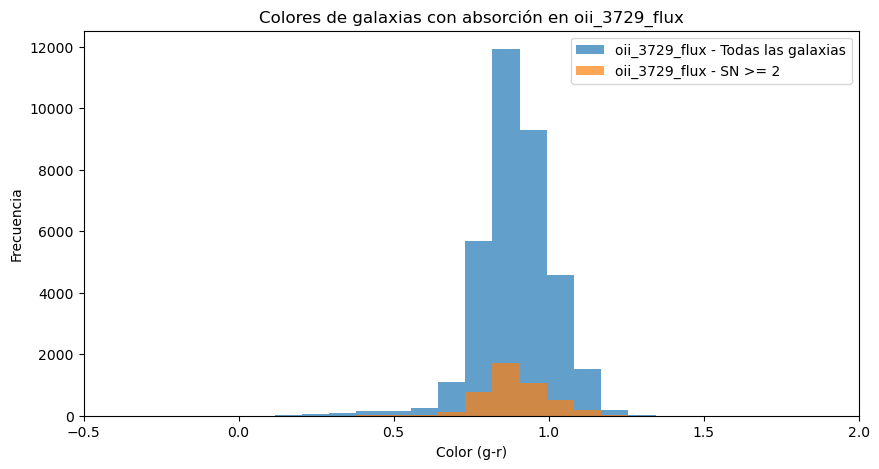

1         False
6         False
8         False
15        False
19        False
          ...  
137182    False
137186    False
137188    False
137205     True
137207    False
Length: 25117, dtype: bool


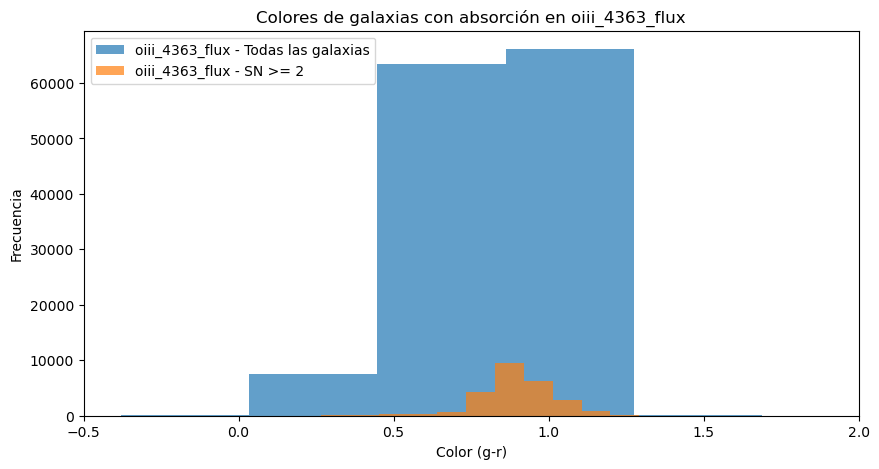

7        False
27       False
34       False
40       False
57       False
         ...  
13798    False
13804    False
13813    False
13821    False
13823    False
Length: 1714, dtype: bool


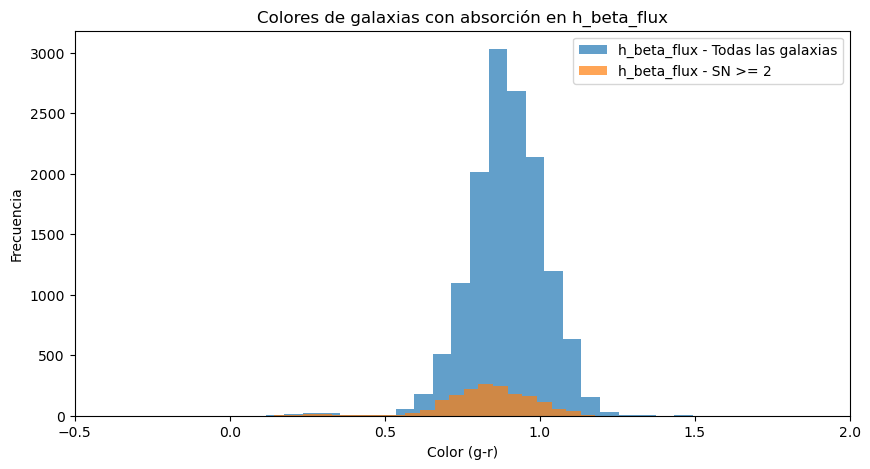

1        False
32       False
33       False
52       False
67       False
         ...  
41382    False
41389    False
41391    False
41399    False
41404    False
Length: 4398, dtype: bool


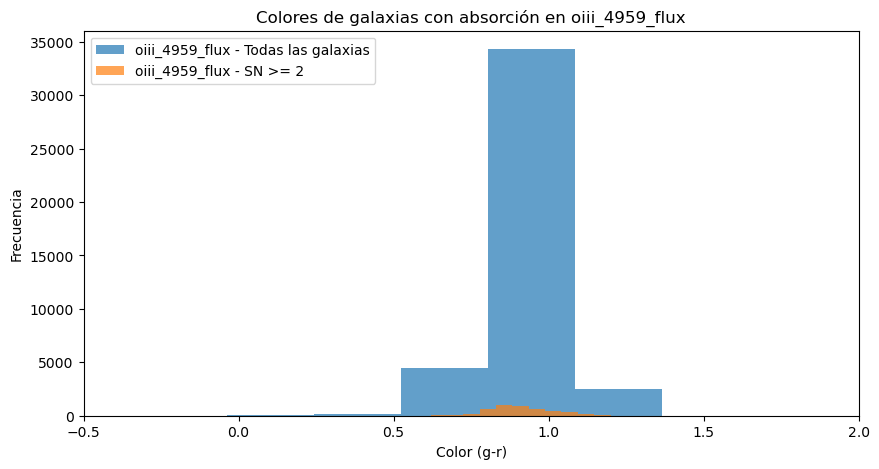

11      False
31      False
42      False
75      False
145     False
        ...  
8658    False
8674    False
8717    False
8724    False
8748    False
Length: 373, dtype: bool


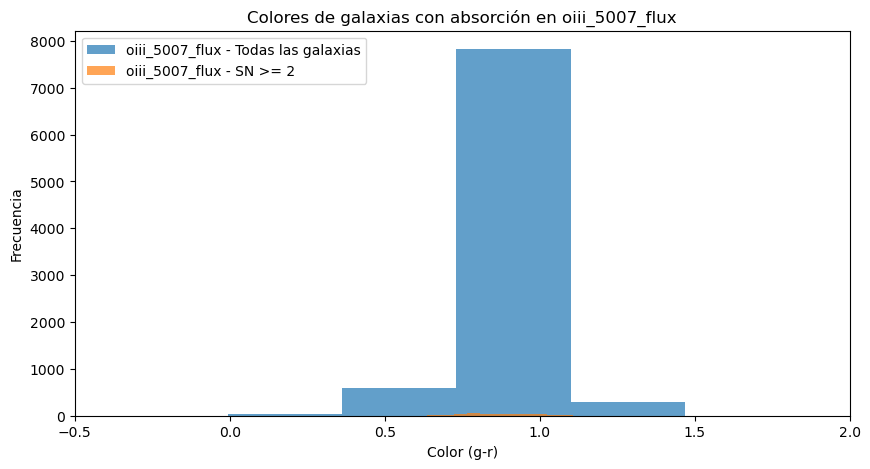

4         False
7         False
8         False
11        False
12        False
          ...  
100770    False
100772    False
100776    False
100780    False
100781    False
Length: 33449, dtype: bool


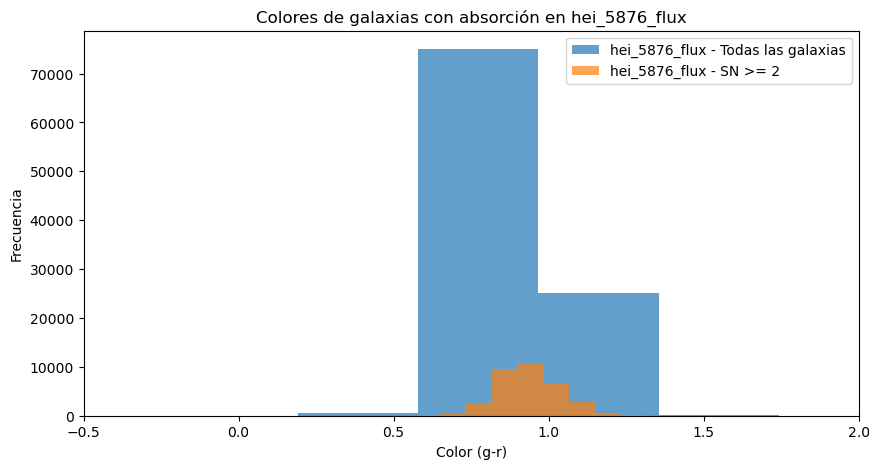

36       False
43       False
63       False
76       False
119      False
         ...  
39655    False
39677    False
39687    False
39731    False
39747    False
Length: 2306, dtype: bool


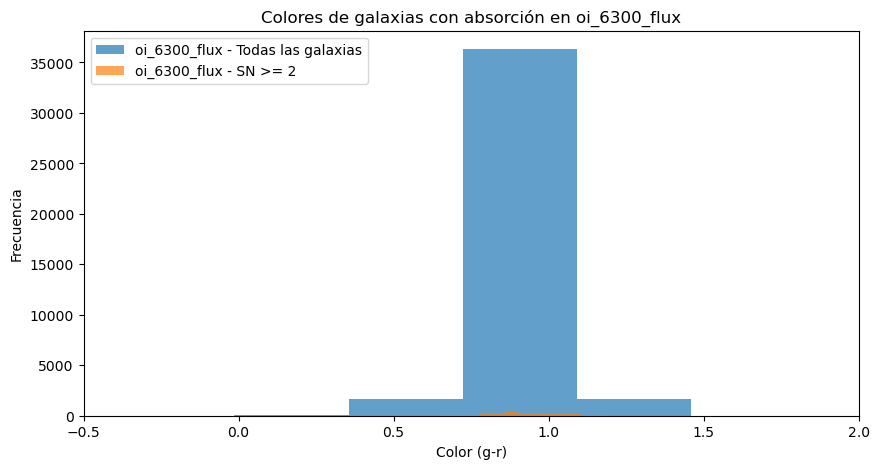

17       False
58       False
69       False
83       False
88       False
         ...  
11721    False
11756    False
11815    False
11829    False
11840    False
Length: 742, dtype: bool


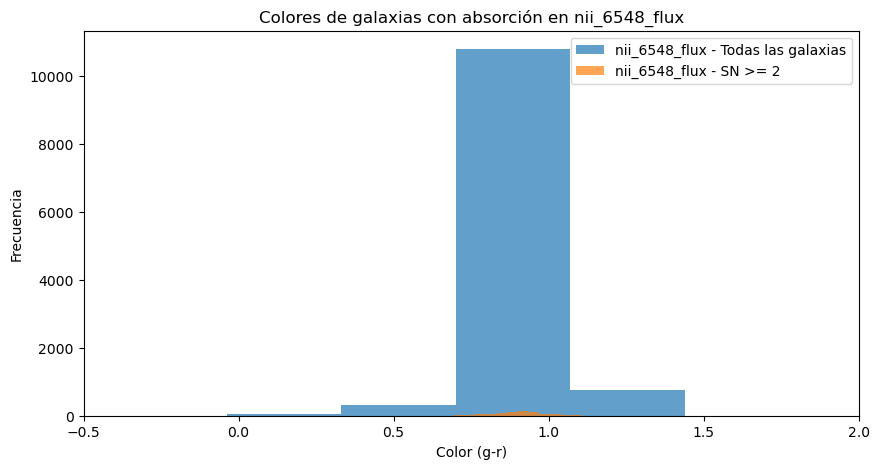

10      False
76      False
96      False
97      False
116     False
        ...  
3526    False
3544    False
3558    False
3582    False
3601    False
Length: 305, dtype: bool


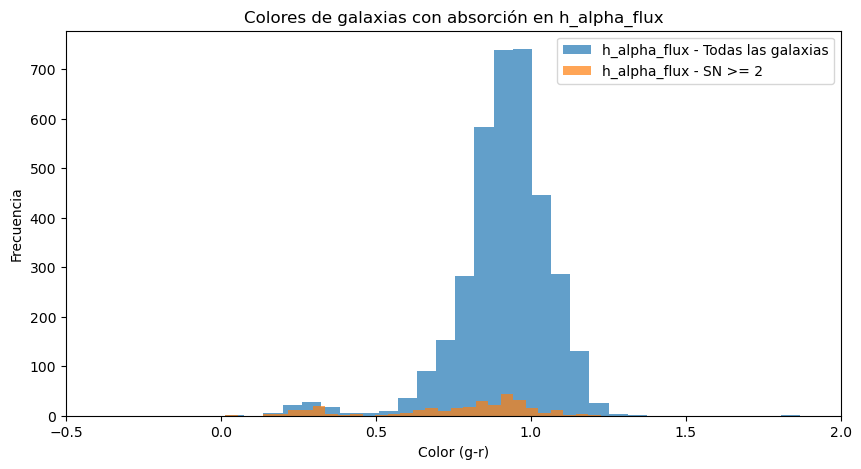

17       False
58       False
69       False
83       False
88       False
         ...  
11721    False
11756    False
11815    False
11829    False
11840    False
Length: 742, dtype: bool


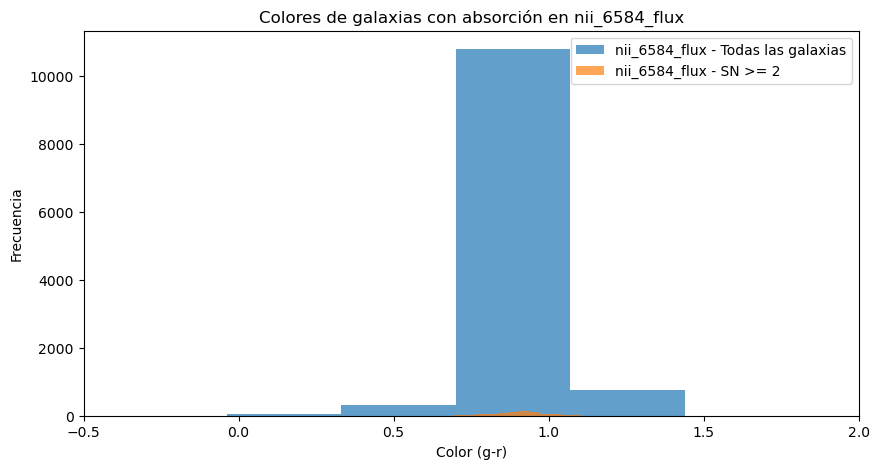

9        False
16       False
17       False
28       False
35       False
         ...  
31851    False
31852    False
31878    False
31885    False
31903    False
Length: 3099, dtype: bool


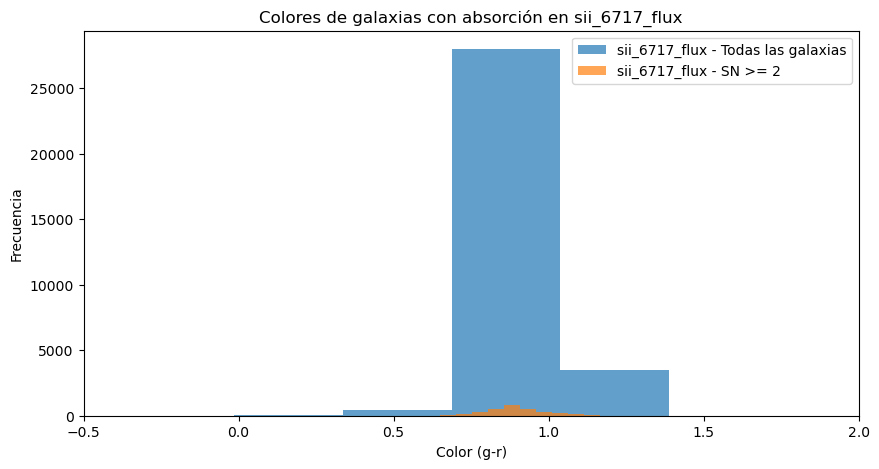

4        False
15       False
21       False
23       False
27       False
         ...  
41250    False
41253    False
41256    False
41260    False
41285    False
Length: 4306, dtype: bool


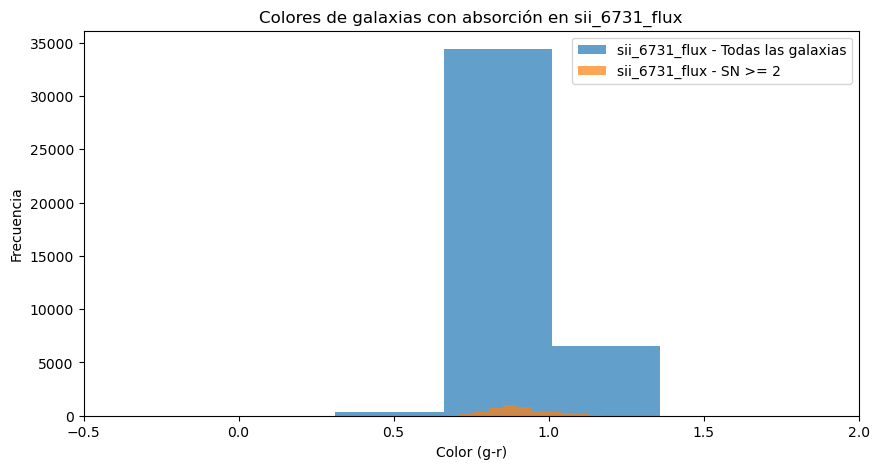

In [33]:
lineas_emision = ['oii_3726_flux', 'oii_3729_flux', 'oiii_4363_flux', 'h_beta_flux', 'oiii_4959_flux',	'oiii_5007_flux', 'hei_5876_flux', 'oi_6300_flux', 'nii_6548_flux',	'h_alpha_flux',	'nii_6584_flux', 'sii_6717_flux', 'sii_6731_flux'] 

df_absorciones = {}
colores_SN2_dict = {}

for linea in lineas_emision:
    # Filtrar las galaxias con absorción (flujo negativo) para la línea en cuestión
    mask_abs_linea = Lineas[linea] < 0
    df_abs_linea = Lineas[mask_abs_linea].copy()
    
    merged_df_abs_linea = pd.merge(data_clean_SN10, df_abs_linea, on='specObjId')


    colores = merged_df_abs_linea['dered_g'] - merged_df_abs_linea['dered_r']
    
    #SN >= 2 
    colores_SN2 = merged_df_abs_linea['dered_g'][np.abs(merged_df_abs_linea[linea]/merged_df_abs_linea[f'{linea}_err']) >= 2] - merged_df_abs_linea['dered_r'][np.abs(merged_df_abs_linea[linea]/merged_df_abs_linea[f'{linea}_err']) >= 2]
    
    df_absorciones[linea] = merged_df_abs_linea
    colores_SN2_dict[linea] = colores_SN2

    plt.figure(figsize=(10, 5))
    plt.hist(colores, bins=30, alpha=0.7, label=f'{linea} - Todas las galaxias')
    plt.hist(colores_SN2, bins=30, alpha=0.7, label=f'{linea} - SN >= 2')
    plt.xlim(-0.5, 2)
    plt.title(f'Colores de galaxias con absorción en {linea}')
    plt.xlabel('Color (g-r)')
    print(colores_SN2<0.5)
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()


In [34]:
mask_color = (merged_df['dered_g'] - merged_df['dered_r']) < 0.5
mask_absorcion = merged_df['h_beta_flux'] < 0
colores_SN2 = merged_df['dered_g'][np.abs(merged_df['h_beta_flux']/merged_df['h_beta_flux_err']) >= 2] - merged_df['dered_r'][np.abs(merged_df['h_beta_flux']/merged_df['h_beta_flux_err']) >= 2]

mask_SN2 = (merged_df['dered_g'] - merged_df['dered_r']).isin(colores_SN2)


mask_total = mask_color & mask_absorcion & mask_SN2
galaxias_seleccionadas = merged_df[mask_total]

galaxias_seleccionadas


,targetObjId,specObjId,plateID,targetType,platerun,mjd,fiberId,plate,tile,ra,dec,subClass,rChi2,velDispZ,velDispErr,velDisp,snMedian,snMedian_u,snMedian_g,snMedian_i,snMedian_r,snMedian_z,err_u,err_g,err_r,err_i,err_z,dered_u,dered_g,dered_r,dered_i,dered_z,flags_photo,sciencePrimary,z,zErr,petroFlux_u,petroFlux_g,petroFlux_r,petroFlux_i,petroFlux_z,petroFluxIvar_u,petroFluxIvar_g,petroFluxIvar_r,petroFluxIvar_i,petroFluxIvar_z,modelFlux_u,modelFlux_g,modelFlux_r,modelFlux_i,modelFlux_z,modelFluxIvar_u,modelFluxIvar_g,modelFluxIvar_r,modelFluxIvar_i,modelFluxIvar_z,etiqueta,r_comovil,r_err,DM,M_r,M_g,M_r_kcorrect,M_g_kcorrect,kcorrect_r,kcorrect_g,M_r_kcorrect_modelFlux,M_g_kcorrect_modelFlux,kcorrect_r_modelFlux,kcorrect_g_modelFlux,oii_3726_flux,oii_3726_flux_err,oii_3729_flux,oii_3729_flux_err,oiii_4363_flux,oiii_4363_flux_err,h_beta_flux,h_beta_flux_err,oiii_4959_flux,oiii_4959_flux_err,oiii_5007_flux,oiii_5007_flux_err,hei_5876_flux,hei_5876_flux_err,oi_6300_flux,oi_6300_flux_err,nii_6548_flux,nii_6548_flux_err,h_alpha_flux,h_alpha_flux_err,nii_6584_flux,nii_6584_flux_err,sii_6717_flux,sii_6717_flux_err,sii_6731_flux,sii_6731_flux_err,reliable,oii_3726_flux_dered,oii_3726_flux_err_dered,oii_3729_flux_dered,oii_3729_flux_err_dered,oiii_4363_flux_dered,oiii_4363_flux_err_dered,h_beta_flux_dered,h_beta_flux_err_dered,oiii_4959_flux_dered,oiii_4959_flux_err_dered,oiii_5007_flux_dered,oiii_5007_flux_err_dered,hei_5876_flux_dered,hei_5876_flux_err_dered,oi_6300_flux_dered,oi_6300_flux_err_dered,nii_6548_flux_dered,nii_6548_flux_err_dered,h_alpha_flux_dered,h_alpha_flux_err_dered,nii_6584_flux_dered,nii_6584_flux_err_dered,sii_6717_flux_dered,sii_6717_flux_err_dered,sii_6731_flux_dered,sii_6731_flux_err_dered
16909,11276756621066256,2866546737974110208,2866541240415971328,SCIENCE,dr2006.05.3,54625,20,2546,8216,326.95128,72.772737,NaN,2.278210,0,35.389920,0.00000,29.23522,1.379260,15.13025,47.12319,39.34219,35.838540,0.082175,0.008979,0.005791,0.005642,0.010434,17.41737,16.19027,15.82797,15.67517,15.58833,35255507619856,1,0.607060,0.000289,19.284480,66.794590,119.102400,164.111600,202.494700,0.096512,0.004338,0.000696,0.000346,0.000403,16.644370,55.312660,114.285000,164.520400,216.414400,0.876830,3.069837,1.302393,0.526178,0.039193,0,2206.223126,5.878559e-15,36.718247,-21.664787,-21.302487,-48.464290,-48.231040,0.440698,0.835393,-48.214146,-47.894627,0.235378,0.703773,0.000000,-0.745626,0.000000,-0.745626,62.746440,34.495540,-53.170710,17.728690,32.950620,16.986120,-2.636741,16.002700,58.598710,11.989040,-14.731090,9.942127,0.184352,2.310861,-56.959720,7.944881,0.556047,6.970083,-23.409420,6.735901,4.367923,6.902188,1,0.000000,-0.751308,0.000000,-0.751315,63.363642,34.834854,-53.793712,17.936417,33.349388,17.191686,-2.669153,16.199410,59.532403,12.180069,-14.993921,10.119513,0.187854,2.354760,-58.045815,8.096372,0.566704,7.103679,-23.872936,6.869275,4.454703,7.039317
17282,11276800104596125,2866551685776435200,2866541240415971328,SCIENCE,dr2006.05.3,54625,38,2546,8216,327.61709,73.058321,NaN,1.702324,0,15.299980,0.00000,18.47098,0.996481,11.06957,29.05289,25.12414,17.424950,0.073604,0.010766,0.008096,0.008530,0.017445,18.23031,17.25283,17.01681,16.97393,16.95998,193619541758552,1,0.337421,0.000171,23.038500,95.814890,215.505900,328.623500,431.995100,0.273931,1.019948,0.350608,0.123591,0.009651,21.456730,107.368300,251.404700,393.313000,557.139800,1.071553,2.807594,0.915903,0.393441,0.035303,4,1307.870335,3.484867e-15,35.582823,-19.340523,-19.104503,-47.440166,-46.955410,0.287275,0.682581,-47.669785,-47.158035,0.349605,0.761599,0.000000,-0.779319,0.000000,-0.779319,12.991330,16.356140,-38.617660,9.262290,-3.355325,7.508782,-13.258810,6.867322,8.300697,6.553384,12.175400,8.101151,-1.731005,1.059335,-27.429410,5.304013,-5.221109,3.195196,-10.854140,3.013885,-5.768019,2.945518,1,0.000000,-0.785258,0.000000,-0.785266,13.119119,16.517026,-39.070144,9.370816,-3.395931,7.599653,-13.421791,6.951737,8.432958,6.657803,12.392632,8.245691,-1.

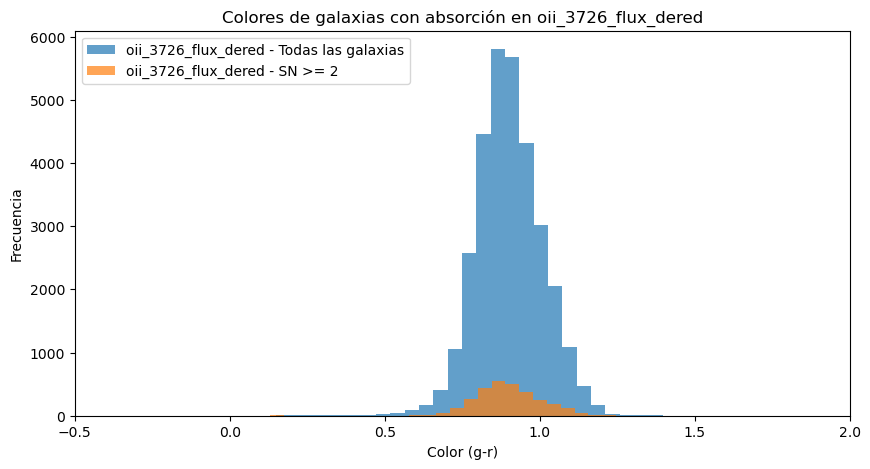

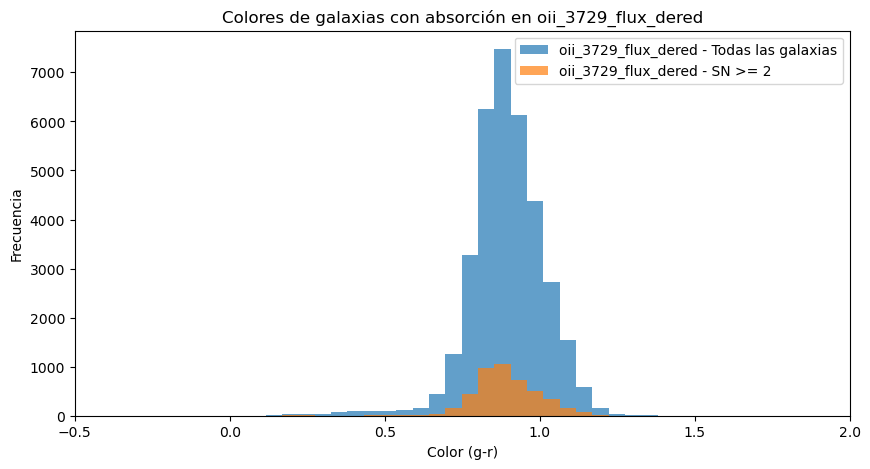

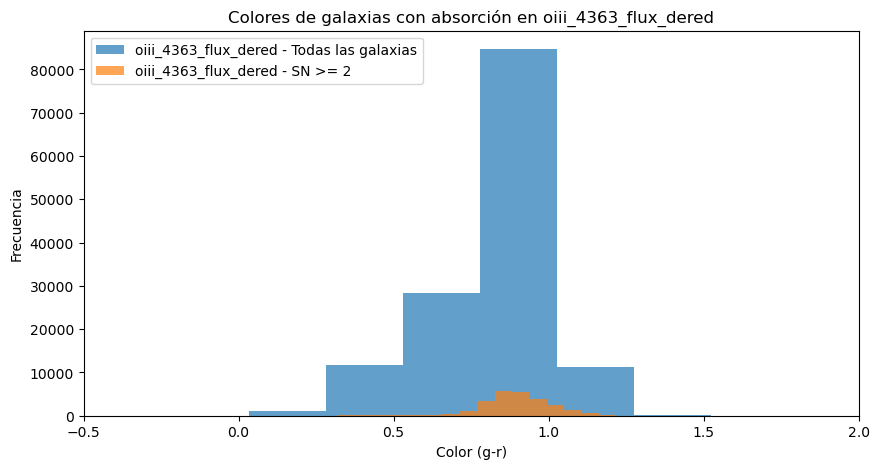

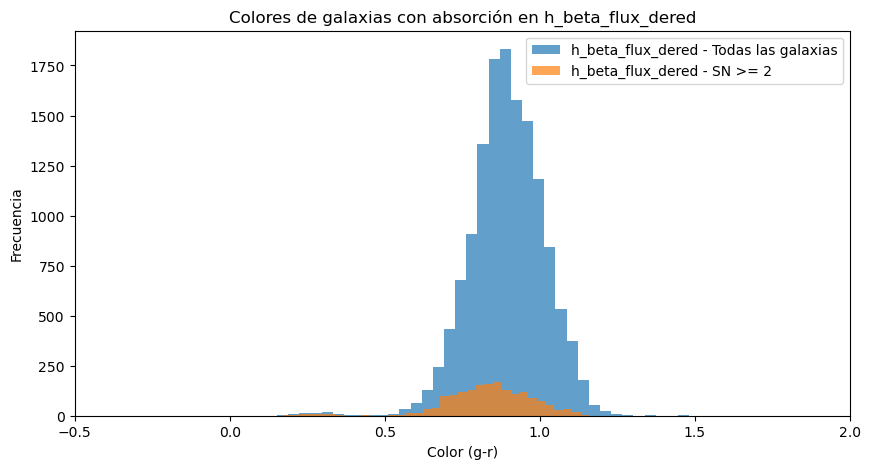

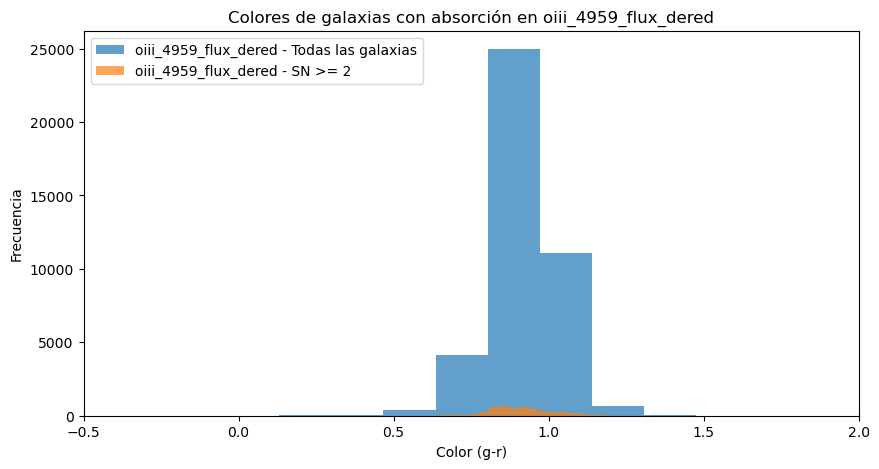

...

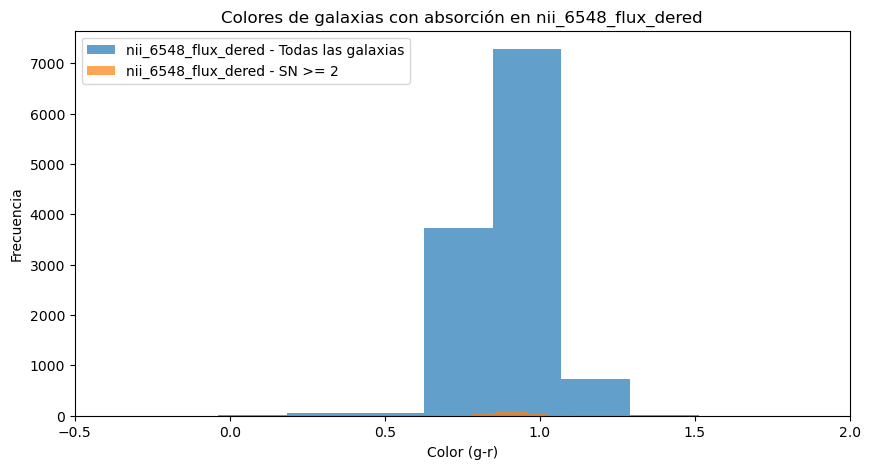

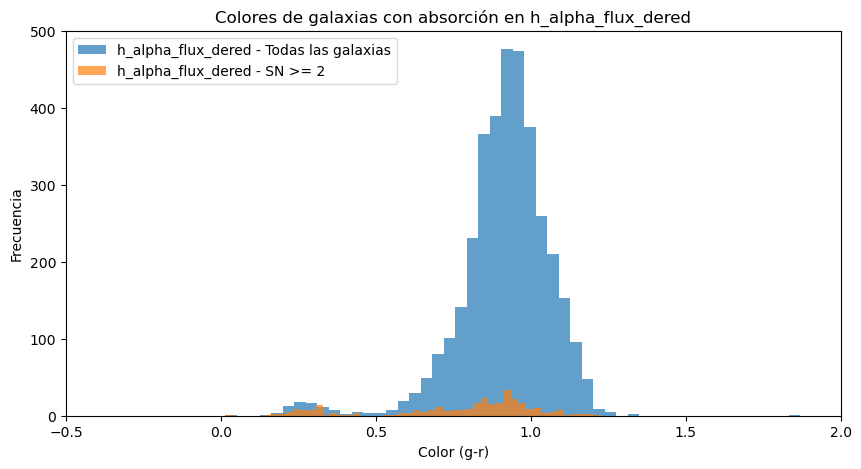

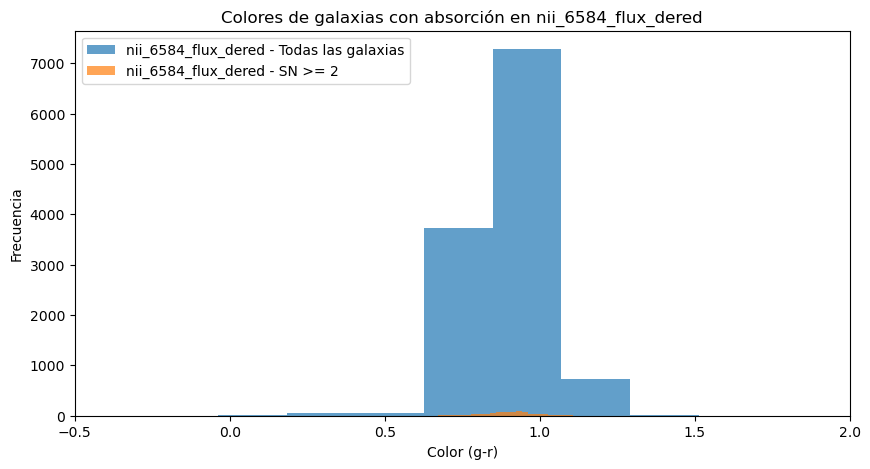

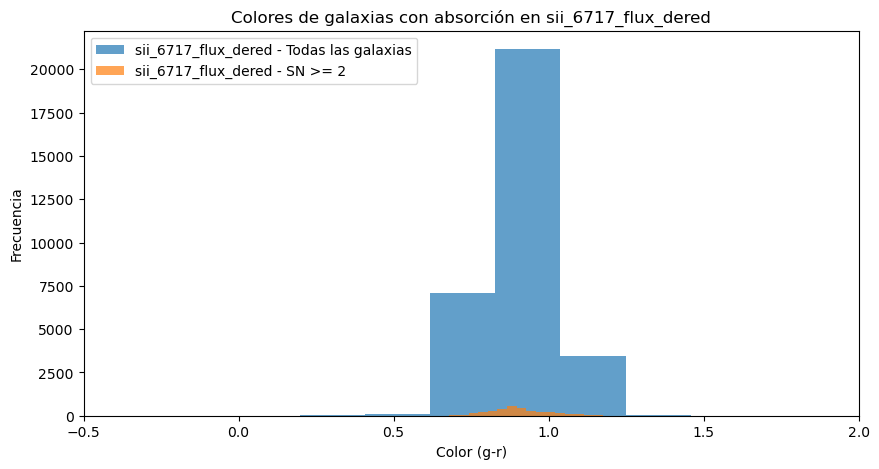

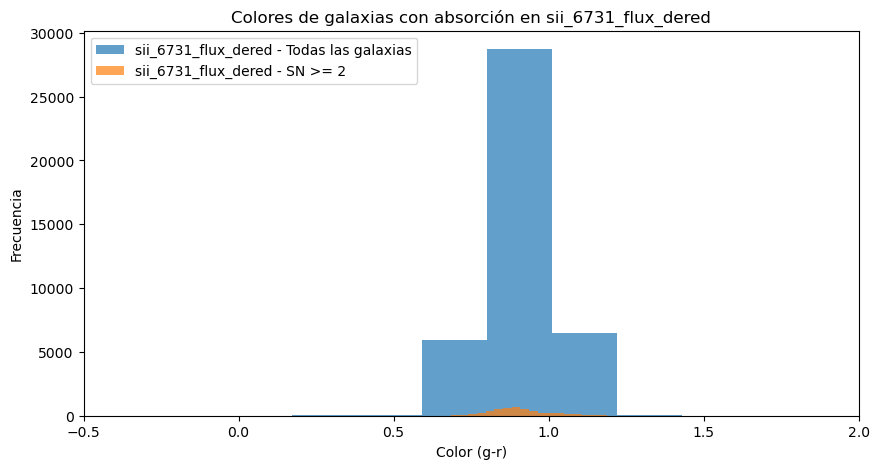

In [35]:
lineas_abs_dered = ['oii_3726_flux_dered', 'oii_3729_flux_dered', 'oiii_4363_flux_dered', 'h_beta_flux_dered', 'oiii_4959_flux_dered', 'oiii_5007_flux_dered', 'hei_5876_flux_dered', 'oi_6300_flux_dered', 'nii_6548_flux_dered', 'h_alpha_flux_dered', 'nii_6584_flux_dered', 'sii_6717_flux_dered', 'sii_6731_flux_dered']

##Errores normales, sin dered
error_columns = ['oii_3726_flux_err', 'oii_3729_flux_err', 'oiii_4363_flux_err', 'h_beta_flux_err', 'oiii_4959_flux_err', 'oiii_5007_flux_err', 'hei_5876_flux_err', 'oi_6300_flux_err', 'nii_6548_flux_err', 'h_alpha_flux_err', 'nii_6584_flux_err', 'sii_6717_flux_err', 'sii_6731_flux_err']

df_absorciones = {}
colores_SN2_dict = {}

for i, linea in enumerate(lineas_abs_dered):
    
    mask_abs_linea = merged_df[linea] < 0
    df_abs_linea = merged_df[mask_abs_linea].copy()
    
    colores = df_abs_linea['dered_g'] - df_abs_linea['dered_r']
    
    #SN >= 2
    colores_SN2 = df_abs_linea['dered_g'][np.abs(df_abs_linea[linea] / df_abs_linea[error_columns[i]]) >= 2] - df_abs_linea['dered_r'][np.abs(df_abs_linea[linea] / df_abs_linea[error_columns[i]]) >= 2]
    
    plt.figure(figsize=(10, 5))
    plt.hist(colores, bins=50, alpha=0.7, label=f'{linea} - Todas las galaxias')
    plt.hist(colores_SN2, bins=50, alpha=0.7, label=f'{linea} - SN >= 2')
    plt.xlim(-0.5, 2)
    plt.title(f'Colores de galaxias con absorción en {linea}')
    plt.xlabel('Color (g-r)')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()


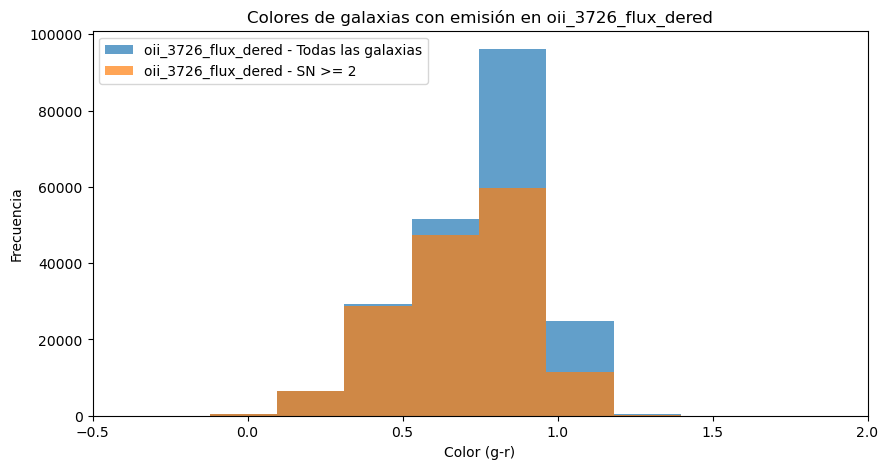

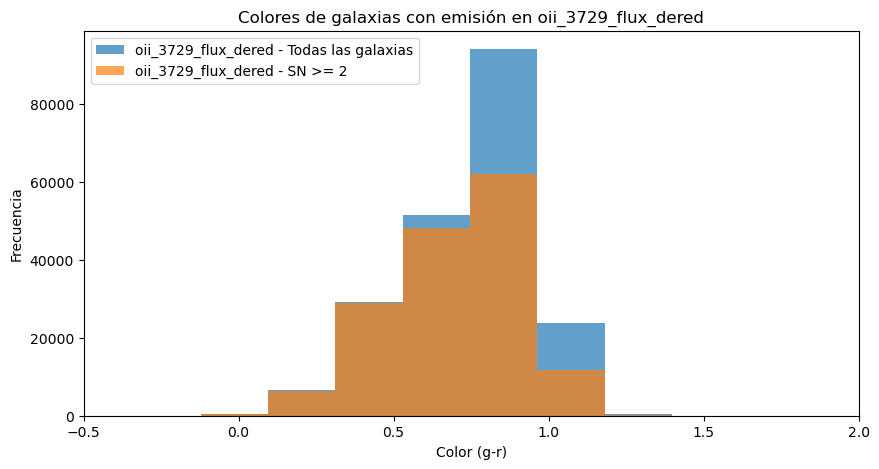

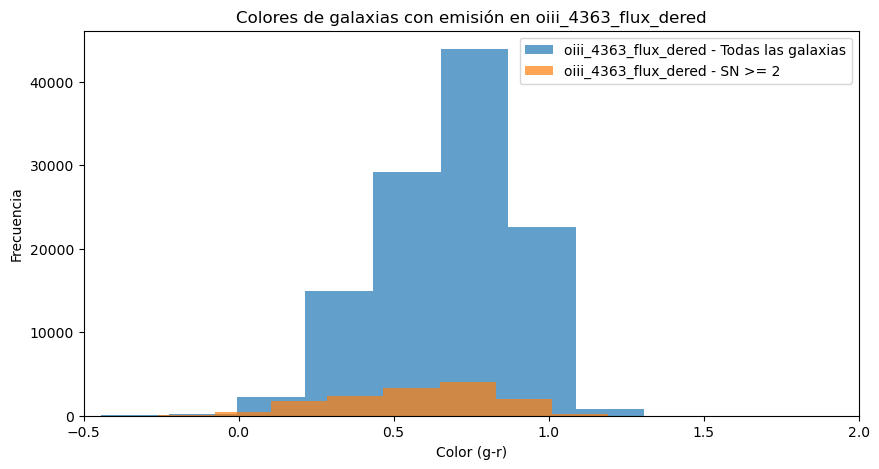

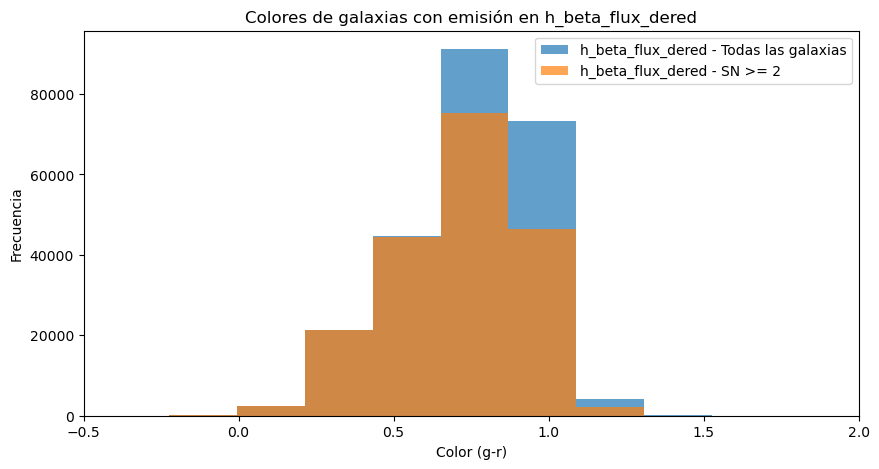

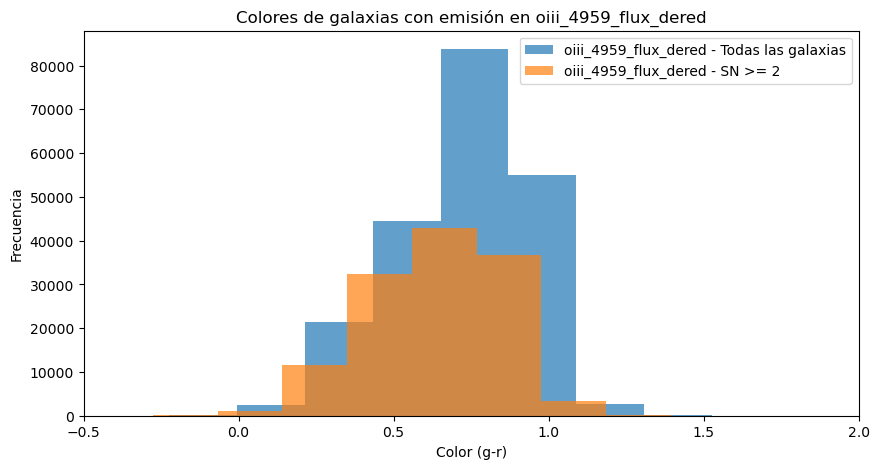

...

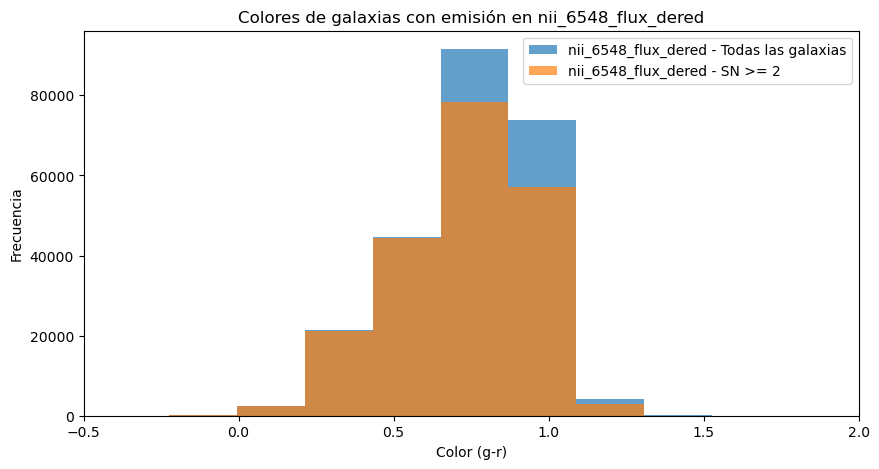

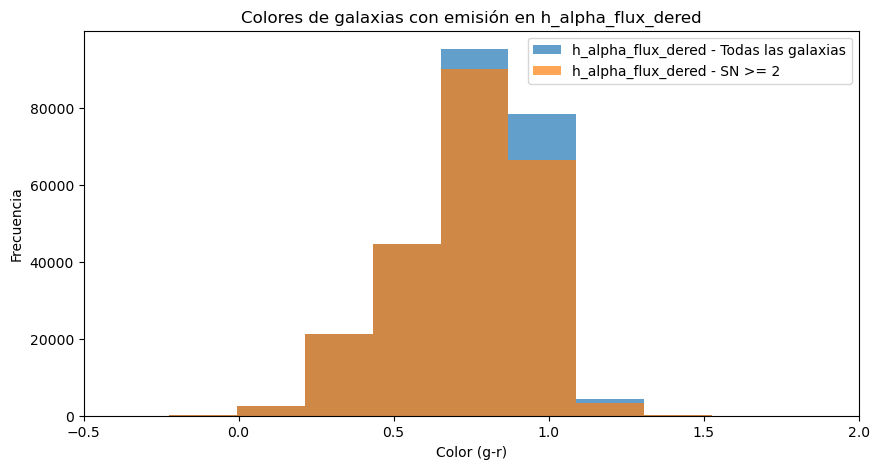

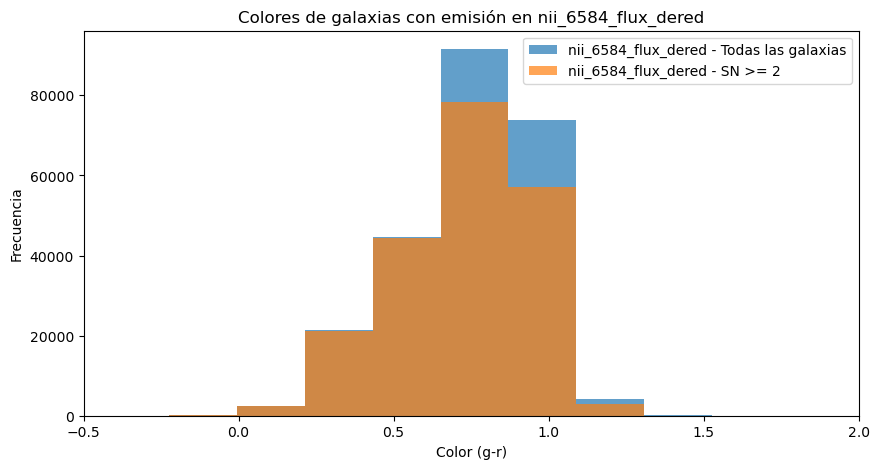

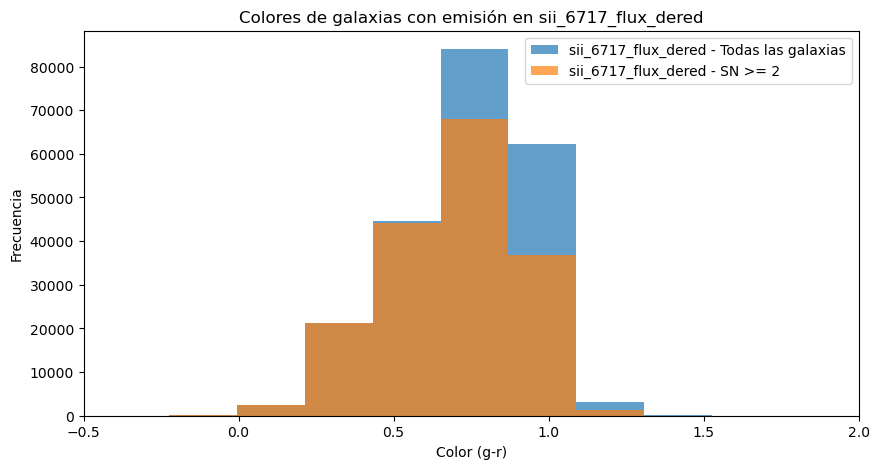

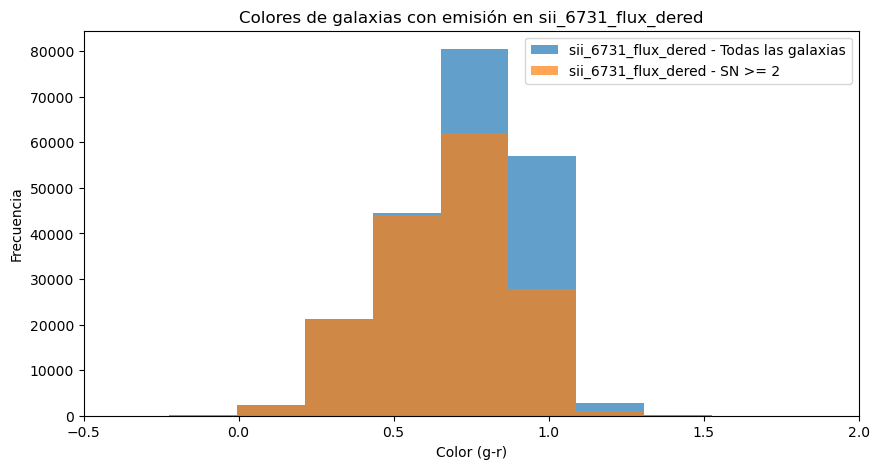

In [36]:
### Emision 

lineas_emision_dered = ['oii_3726_flux_dered', 'oii_3729_flux_dered', 'oiii_4363_flux_dered', 'h_beta_flux_dered', 'oiii_4959_flux_dered', 'oiii_5007_flux_dered', 'hei_5876_flux_dered', 'oi_6300_flux_dered', 'nii_6548_flux_dered', 'h_alpha_flux_dered', 'nii_6584_flux_dered', 'sii_6717_flux_dered', 'sii_6731_flux_dered']

##Errores normales, sin dered
error_columns = ['oii_3726_flux_err', 'oii_3729_flux_err', 'oiii_4363_flux_err', 'h_beta_flux_err', 'oiii_4959_flux_err', 'oiii_5007_flux_err', 'hei_5876_flux_err', 'oi_6300_flux_err', 'nii_6548_flux_err', 'h_alpha_flux_err', 'nii_6584_flux_err', 'sii_6717_flux_err', 'sii_6731_flux_err']

for i, linea in enumerate(lineas_emision_dered):
    
    mask_abs_linea = merged_df[linea] > 0
    df_em_linea = merged_df[mask_abs_linea].copy()
    
    colores = df_em_linea['dered_g'] - df_em_linea['dered_r']
    
    #SN >= 2
    colores_SN2 = df_em_linea['dered_g'][np.abs(df_em_linea[linea] / df_em_linea[error_columns[i]]) >= 2] - df_em_linea['dered_r'][np.abs(df_em_linea[linea] / df_em_linea[error_columns[i]]) >= 2]
    
    plt.figure(figsize=(10, 5))
    plt.hist(colores, bins=60, alpha=0.7, label=f'{linea} - Todas las galaxias')
    plt.hist(colores_SN2, bins=60, alpha=0.7, label=f'{linea} - SN >= 2')
    plt.xlim(-0.5, 2)
    plt.title(f'Colores de galaxias con emisión en {linea}')
    plt.xlabel('Color (g-r)')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.show()


## Trabajo con líneas SN > 2

In [17]:

merged_df_filtered = pd.merge(data_clean_SN10, filtered_data, on='specObjId') #filtered lines by SN>5
merged_df_filtered_SN2 = pd.merge(data_clean_SN10, filtered_data_SN2, on='specObjId') #SN>2


In [18]:
### Creacion columnas de color: 
merged_df_filtered['color_gr'] = merged_df_filtered['dered_g'] - merged_df_filtered['dered_r']
merged_df_filtered_SN2['color_gr'] = merged_df_filtered_SN2['dered_g'] - merged_df_filtered_SN2['dered_r']

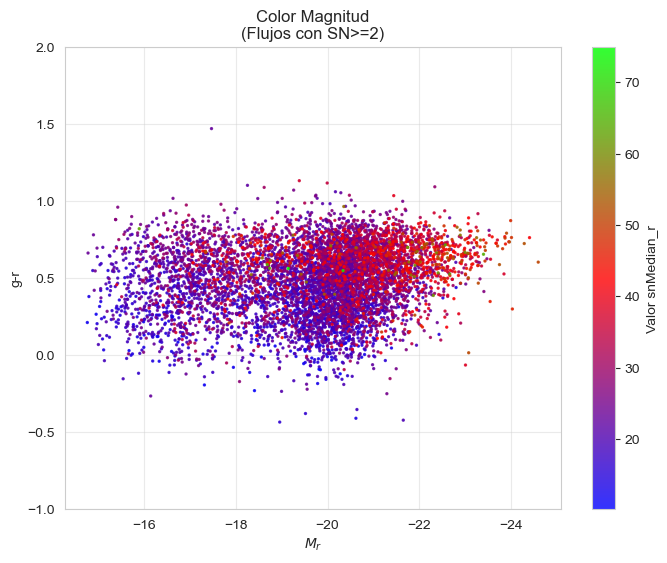

In [32]:
### chequear la fotometría
sns.set_style("whitegrid")
graficos.color_Mag(merged_df_filtered_SN2, merged_df_filtered_SN2['color_gr'], 'snMedian_r', color_map='brg')
plt.ylim(-1,2)
plt.grid(alpha=0.4)
plt.title('Color Magnitud\n(Flujos con SN>=2)')
plt.gca().invert_xaxis()


### SN vs Redshift

In [53]:
z_values = merged_df['z']
z_values_filtered = merged_df_filtered['z']
z_values_filtered_SN2 = merged_df_filtered_SN2['z']
 
#z_values

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_8049/4017656816.py:13: RuntimeWarning: invalid value encountered in divide
  err_rel = column_data_flux / column_data_err


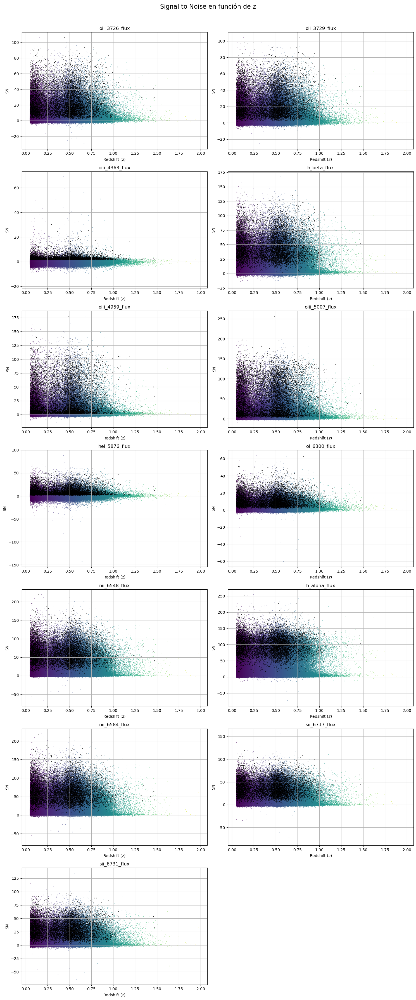

In [54]:
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  

for i, (col_err, col_flux) in enumerate(zip(columns, columns_1)):
    column_data_err = Lineas[col_err].to_numpy()
    column_data_flux = Lineas[col_flux].to_numpy()
    #column_data_err_filt = filtered_data[col_err].to_numpy()
    #column_data_flux_filt = filtered_data[col_flux].to_numpy()
    column_data_err_filt = filtered_data_SN2[col_err].to_numpy()
    column_data_flux_filt = filtered_data_SN2[col_flux].to_numpy()

    #SN
    err_rel = column_data_flux / column_data_err
    err_rel_filt = column_data_flux_filt / column_data_err_filt
    

    axes[i].scatter(z_values, err_rel, 
                              alpha=0.7,            
                              c=z_values,           
                              cmap='viridis',       
                              s=0.2)
    
    axes[i].scatter(z_values_filtered_SN2, err_rel_filt, 
                              alpha=0.7,            
                              c='k',             
                              s=0.7)  
    axes[i].set_title(f'{col_flux}')
    #axes[i].set_yscale('log')
    axes[i].set_ylabel('SN')
    axes[i].set_xlabel('Redshift ($z$)')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Signal to Noise en función de $z$", y=1.02, fontsize=16)
plt.show()


### SN vs magnitud aparente

(array([5.00000e+00, 1.44400e+03, 2.03259e+05, 3.24600e+04, 1.00380e+04,
        3.13200e+03, 8.58000e+02, 2.22000e+02, 3.60000e+01, 7.00000e+00]),
 array([-29.46373353, -15.91800915,  -2.37228478,  11.1734396 ,
         24.71916398,  38.26488835,  51.81061273,  65.3563371 ,
         78.90206148,  92.44778585, 105.99351023]),
 <BarContainer object of 10 artists>)

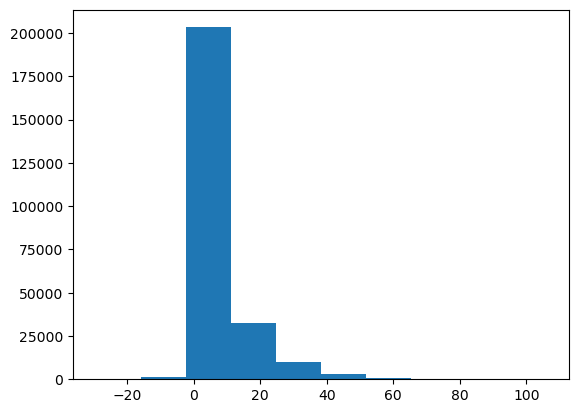

In [55]:
plt.hist(Lineas['oii_3726_flux']/Lineas['oii_3726_flux_err'])

/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_8049/2138783657.py:13: RuntimeWarning: invalid value encountered in divide
  err_rel = column_data_flux / column_data_err


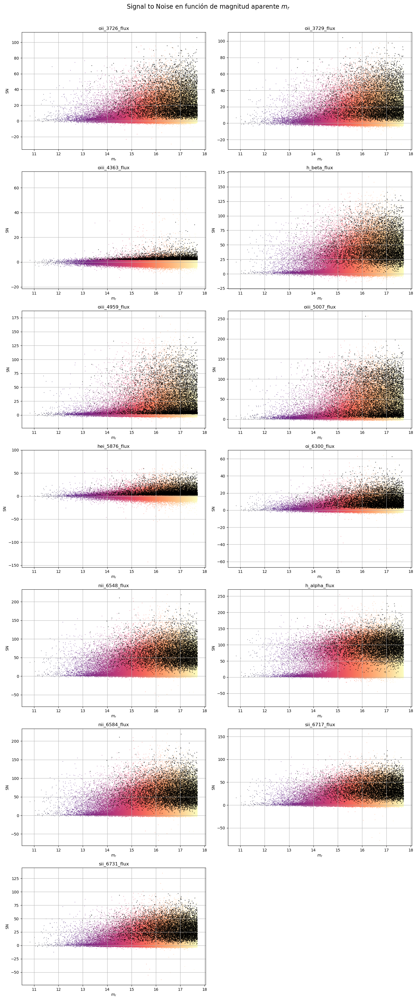

In [56]:
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  

for i, (col_err, col_flux) in enumerate(zip(columns, columns_1)):
    column_data_err = Lineas[col_err].to_numpy()
    column_data_flux = Lineas[col_flux].to_numpy()
    #column_data_err_filt = filtered_data[col_err].to_numpy()
    #column_data_flux_filt = filtered_data[col_flux].to_numpy()
    column_data_err_filt = filtered_data_SN2[col_err].to_numpy()
    column_data_flux_filt = filtered_data_SN2[col_flux].to_numpy()

    #SN
    err_rel = column_data_flux / column_data_err
    err_rel_filt = column_data_flux_filt / column_data_err_filt
    

    axes[i].scatter(merged_df['dered_r'], err_rel, 
                              alpha=0.7,            
                              c=merged_df['dered_r'],           
                              cmap="magma",      
                              s=0.2)
    axes[i].scatter(merged_df_filtered_SN2['dered_r'], err_rel_filt, 
                              alpha=0.7,            
                              c='k',           
                              s=0.7) 
    axes[i].set_title(f'{col_flux}')
    #axes[i].set_yscale('log')
    axes[i].set_ylabel('SN')
    axes[i].set_xlabel('$m_r$')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Signal to Noise en función de magnitud aparente $m_r$", y=1.02, fontsize=16)
plt.show()


/var/folders/0s/_xxgbjs554192y_2w2mspv3c0000gn/T/ipykernel_8049/2640259444.py:13: RuntimeWarning: invalid value encountered in divide
  err_rel = column_data_flux / column_data_err


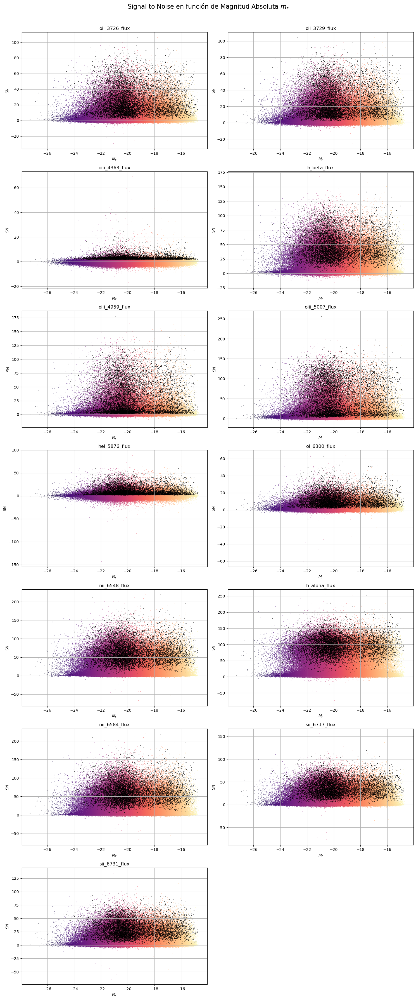

In [57]:
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))
axes = axes.flatten()  

for i, (col_err, col_flux) in enumerate(zip(columns, columns_1)):
    column_data_err = Lineas[col_err].to_numpy()
    column_data_flux = Lineas[col_flux].to_numpy()
    #column_data_err_filt = filtered_data[col_err].to_numpy()
    #column_data_flux_filt = filtered_data[col_flux].to_numpy()
    column_data_err_filt = filtered_data_SN2[col_err].to_numpy()
    column_data_flux_filt = filtered_data_SN2[col_flux].to_numpy()

    #SN
    err_rel = column_data_flux / column_data_err
    err_rel_filt = column_data_flux_filt / column_data_err_filt
    

    axes[i].scatter(merged_df['M_r'], err_rel, 
                              alpha=0.7,            
                              c=merged_df['M_r'],           
                              cmap="magma",      
                              s=0.2)
    axes[i].scatter(merged_df_filtered_SN2['M_r'], err_rel_filt, 
                              alpha=0.7,            
                              c='k',           
                              s=0.7) 
    axes[i].set_title(f'{col_flux}')
    #axes[i].set_yscale('log')
    axes[i].set_ylabel('SN')
    axes[i].set_xlabel('$M_r$')
    axes[i].grid(True)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Signal to Noise en función de Magnitud Absoluta $m_r$", y=1.02, fontsize=16)
plt.show()


## Diagramas de Diagnóstico

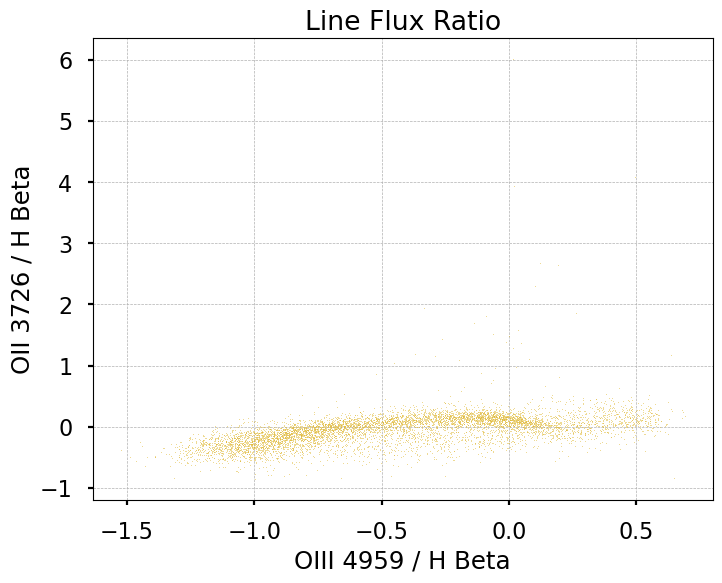

In [78]:
#### Diagramas de Diagnóstico ####

#x_data = merged_df['oiii_4959_flux']/merged_df['h_beta_flux']
#y_data = merged_df['oii_3726_flux']/merged_df['h_beta_flux']
x_data = np.log10(merged_df_filtered_SN2['oiii_4959_flux']/merged_df_filtered_SN2['h_beta_flux'])
y_data = np.log10(merged_df_filtered_SN2['oii_3726_flux']/merged_df_filtered_SN2['h_beta_flux'])

#x_data = np.log10(merged_df['oiii_4959_flux_dered']/merged_df['h_beta_flux_dered'])
#y_data = np.log10(merged_df['oii_3726_flux_dered']/merged_df['h_beta_flux_dered'])


plt.figure(figsize=(8, 6))
plt.plot(x_data, y_data, '.', color='#E0B834', alpha=1, markersize=0.9)

#plt.yscale('log')
#plt.xscale('log')

plt.xlabel('OIII 4959 / H Beta')
plt.ylabel('OII 3726 / H Beta')

plt.title('Line Flux Ratio')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.style.use('seaborn-v0_8-poster')
plt.show()

In [59]:
print(plt.style.available)


['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


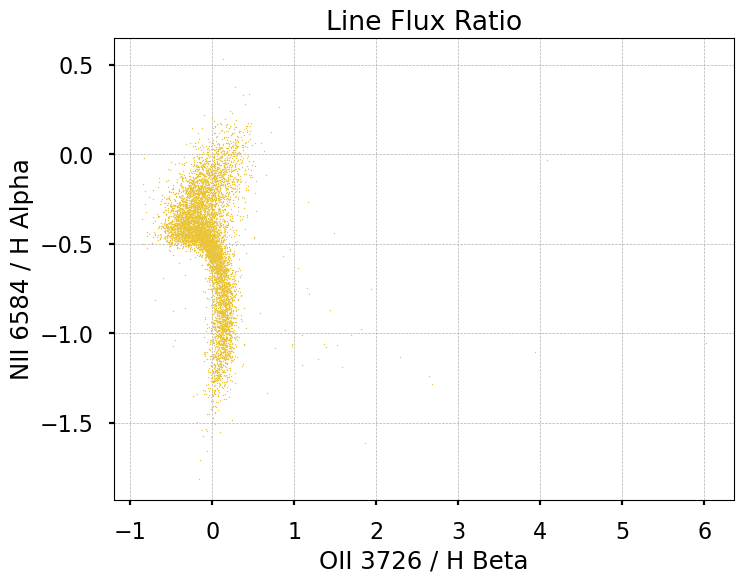

In [79]:
#x_data = merged_df['oii_3726_flux'] / merged_df['h_beta_flux']
#y_data = merged_df['nii_6584_flux'] / merged_df['h_alpha_flux']

x_data = np.log10(merged_df_filtered_SN2['oii_3726_flux'] / merged_df_filtered_SN2['h_beta_flux'])
y_data = np.log10(merged_df_filtered_SN2['nii_6584_flux'] / merged_df_filtered_SN2['h_alpha_flux'])


plt.figure(figsize=(8, 6))
plt.plot(x_data, y_data, '.', color='#EAC539', alpha=1, markersize=2)

plt.xlabel('OII 3726 / H Beta')
plt.ylabel('NII 6584 / H Alpha')
plt.title('Line Flux Ratio')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

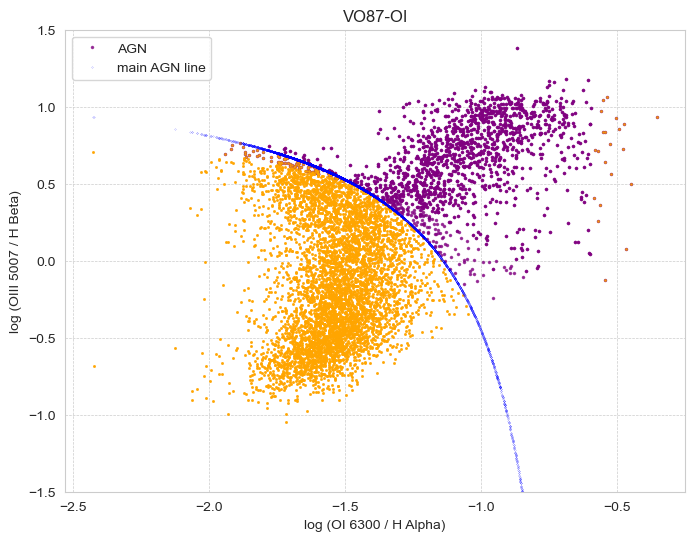

In [74]:
x_data = np.log10(merged_df_filtered_SN2['oi_6300_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux'] / merged_df_filtered_SN2['h_beta_flux'])

### Corregigas por extinción
#x_data = np.log10(merged_df['oi_6300_flux_dered'] / merged_df['h_alpha_flux_dered'])
#y_data = np.log10(merged_df['oiii_5007_flux_dered'] / merged_df['h_beta_flux_dered'])

# AGN line y LINER/Sy2 line
log_y_agn = 0.73 / (x_data + 0.59) + 1.33
log_y_LINER = 1.18 / (x_data) + 1.30

ids_agn = merged_df_filtered_SN2[y_data > log_y_agn].index

plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=2)
plt.plot(x_data[y_data > log_y_LINER], y_data[y_data > log_y_LINER], '.', color='purple', alpha=0.7, markersize=3)
plt.plot(x_data[y_data > log_y_agn], y_data[y_data > log_y_agn], '.', color='purple', alpha=0.7, markersize=3, label='AGN')
plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=2)

plt.plot(x_data, log_y_agn, '.', color='blue', label='main AGN line', markersize=0.2)
#plt.plot(x_data, log_y_LINER, '.', color='red', label='LINER/Sy2 line', markersize=0.2)

#plt.yscale('log')
#plt.xscale('log')
plt.ylim(-1.5,1.5)
plt.legend()

plt.xlabel('log (OI 6300 / H Alpha)')
plt.ylabel('log (OIII 5007 / H Beta)')
plt.title('VO87-OI')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

In [82]:
### Columna para identificador de host de AGN con Diagnóstico VO87-OI####

merged_df_filtered_SN2['AGN_VO87-OI'] = False

merged_df_filtered_SN2.loc[ids_agn, 'AGN_VO87-OI'] = True


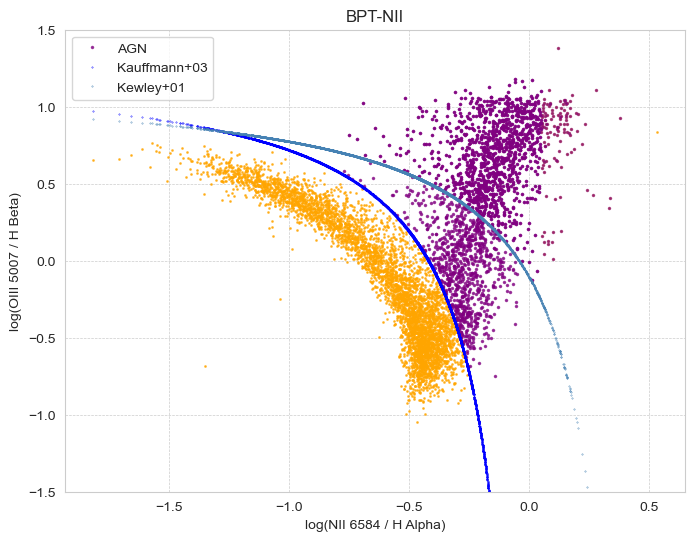

In [68]:

#x_data = merged_df['nii_6584_flux'] / merged_df['h_alpha_flux']
#y_data = merged_df['oiii_4959_flux'] / merged_df['h_beta_flux']
x_data = np.log10(merged_df_filtered_SN2['nii_6584_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux'] / merged_df_filtered_SN2['h_beta_flux'])


# Kauffmann+03 and Kewley+01
log_y_kauffmann = 0.61 / (x_data - 0.05) + 1.3
log_y_kewley = 0.61 / ((x_data) - 0.47) + 1.19

ids_encima_kewley = merged_df_filtered_SN2[y_data > log_y_kewley].index
ids_encima_kauffman = merged_df_filtered_SN2[y_data > log_y_kauffmann].index


plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data <= log_y_kauffmann], y_data[y_data <= log_y_kauffmann], '.', color='orange', alpha=0.7, markersize=2)

plt.plot(x_data[y_data > log_y_kewley], y_data[y_data > log_y_kewley], '.', color='purple', alpha=0.6, markersize=3)
plt.plot(x_data[y_data > log_y_kauffmann], y_data[y_data > log_y_kauffmann], '.', color='purple', alpha=0.7, markersize=3, label='AGN')

plt.plot(x_data, log_y_kauffmann, '.', color='blue', label='Kauffmann+03', markersize=0.6, alpha=1)
plt.plot(x_data, log_y_kewley, '.', color='steelblue', label='Kewley+01', markersize=0.6, alpha=1)

#plt.yscale('log')
#plt.xscale('log')
plt.ylim(-1.5,1.5)

plt.ylabel('log(OIII 5007 / H Beta)')
plt.xlabel('log(NII 6584 / H Alpha)')
plt.title('BPT-NII')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.legend()
plt.show()

In [69]:
### Columna para identificador de host de AGN con Diagnóstico BPT-NII####

merged_df_filtered_SN2['AGN_BPT-NII'] = False

merged_df_filtered_SN2.loc[ids_encima_kauffman, 'AGN_BPT-NII'] = True
merged_df_filtered_SN2.loc[ids_encima_kewley, 'AGN_BPT-NII'] = True

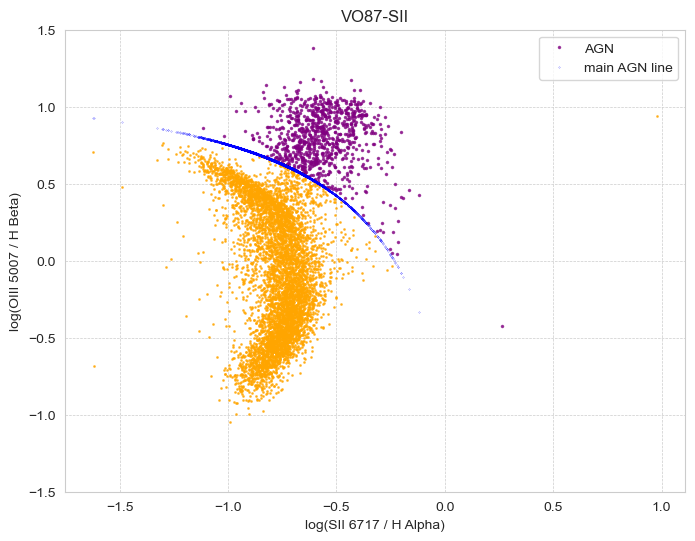

In [75]:
#x_data = merged_df['sii_6717_flux'] / merged_df['h_alpha_flux']
#y_data = merged_df['oiii_4959_flux'] / merged_df['h_beta_flux']
x_data = np.log10(merged_df_filtered_SN2['sii_6717_flux'] / merged_df_filtered_SN2['h_alpha_flux'])
y_data = np.log10(merged_df_filtered_SN2['oiii_5007_flux'] / merged_df_filtered_SN2['h_beta_flux'])


# AGN line y LINER/Sy2 line
log_y_agn = 0.72 / ((x_data) - 0.32) + 1.30
log_y_LINER = 1.89 / (x_data) + 0.76

ids_agn = merged_df_filtered_SN2[y_data > log_y_agn].index

plt.figure(figsize=(8, 6))

plt.plot(x_data[y_data > log_y_agn], y_data[y_data > log_y_agn], '.', color='purple', alpha=0.7, markersize=3, label='AGN')

plt.plot(x_data[y_data <= log_y_agn], y_data[y_data <= log_y_agn], '.', color='orange', alpha=0.7, markersize=2)
plt.plot(x_data, log_y_agn, '.', color='blue', label='main AGN line', markersize=0.3)
#plt.plot(x_data, log_y_LINER, '.', color='red', label='LINER/Sy2 line', markersize=0.2)

#plt.yscale('log')
#plt.xscale('log')

plt.ylim(-1.5, 1.5)
plt.xlabel('log(SII 6717 / H Alpha)')
plt.ylabel('log(OIII 5007 / H Beta)')
plt.title('VO87-SII')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.legend()
plt.show()

In [86]:
### Columna para identificador de host de AGN con Diagnóstico VO87-SII####

merged_df_filtered_SN2['AGN_VO87-SII'] = False

merged_df_filtered_SN2.loc[ids_agn, 'AGN_VO87-SII'] = True

In [87]:
#### Guardar data frame para usar en analisis de cocientes ####

merged_df_filtered_SN2.to_csv('lineas_filtradas_SN2.csv', index=False)